<a href="https://colab.research.google.com/github/rahimulll/Assignment-1/blob/main/CSE499RTK_ML2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
import torch # Import the torch module
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.5 MB/s eta 0:00:00


In [ ]:
df = pd.read_excel("New Final DataSet Without Sulphur.xlsx", engine='openpyxl')

In [ ]:
df.head()

,N,P,K,pH,Temp(°C),Humidity(%),Moisture(%),Rainfall(cm),Crop
0,146.0,44.0,26,6.2,31,76.0,81,124,Aman Rice
1,229.0,35.0,31,6.1,22,73.3,72,137,Aman Rice
2,281.0,26.0,35,6.0,32,79.5,86,124,Aman Rice
3,161.0,23.0,42,6.2,36,71.8,86,145,Aman Rice
4,155.0,45.0,34,6.3,22,73.0,71,144,Aman Rice


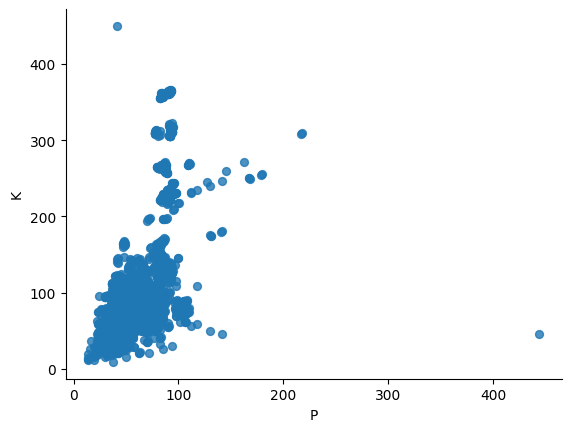

In [ ]:
# @title P vs K

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='P', y='K', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

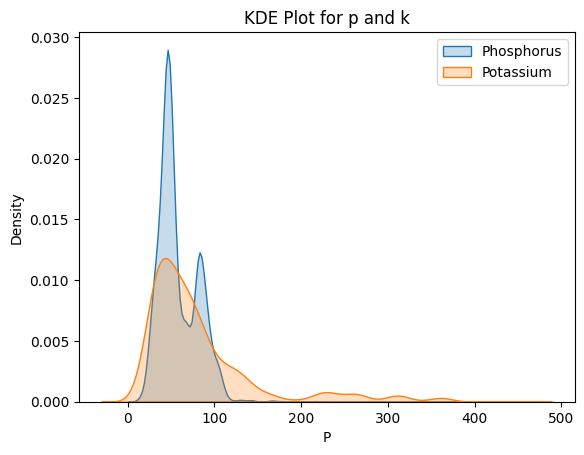

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and it contains columns 'p' and 'k'
sns.kdeplot(df['P'], label='Phosphorus', fill=True)
sns.kdeplot(df['K'], label='Potassium', fill=True)

plt.title('KDE Plot for p and k')
plt.legend()
plt.show()

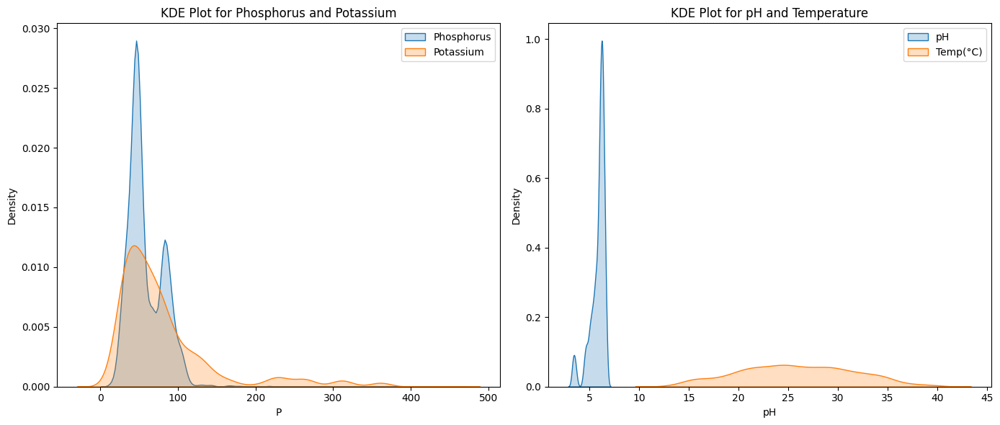

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a figure with 1 row and 2 columns for side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# First plot: Phosphorus and Potassium
sns.kdeplot(df['P'], label='Phosphorus', fill=True, ax=axes[0])
sns.kdeplot(df['K'], label='Potassium', fill=True, ax=axes[0])
axes[0].set_title('KDE Plot for Phosphorus and Potassium')
axes[0].legend()

# Second plot: pH and Temperature
sns.kdeplot(df['pH'], label='pH', fill=True, ax=axes[1])
sns.kdeplot(df['Temp(°C)'], label='Temp(°C)', fill=True, ax=axes[1])
axes[1].set_title('KDE Plot for pH and Temperature')
axes[1].legend()

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig('kde_plots_side_by_side.png')
plt.show()


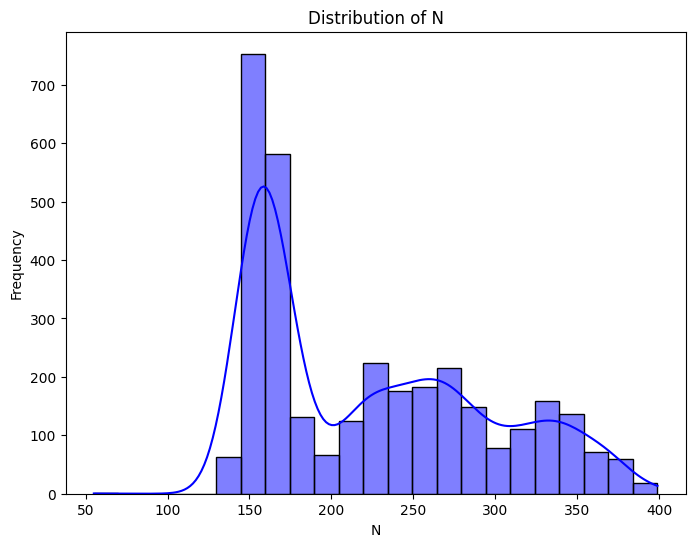

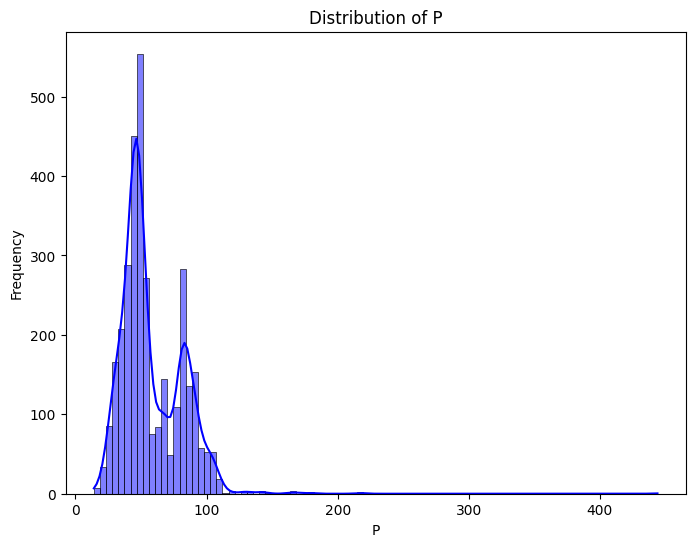

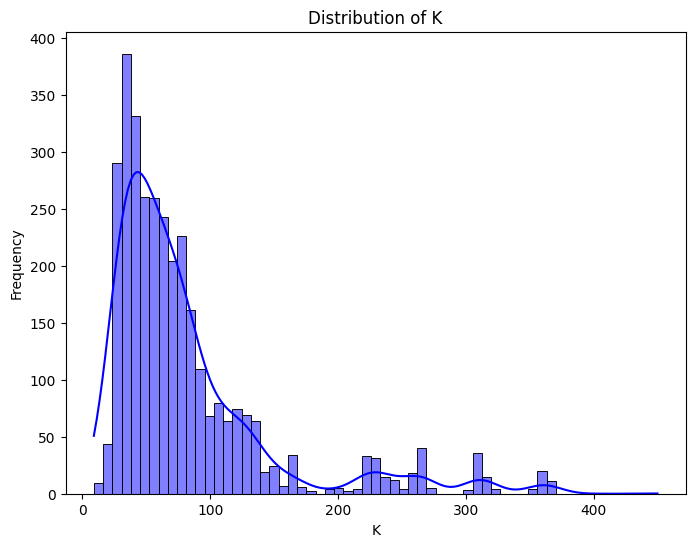

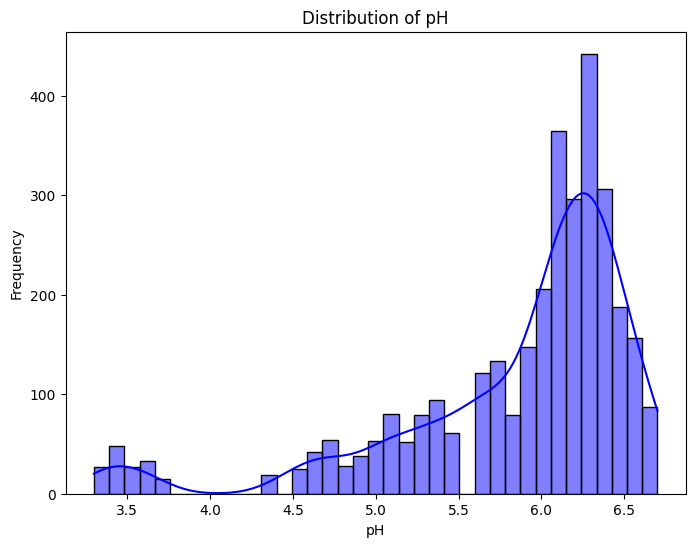

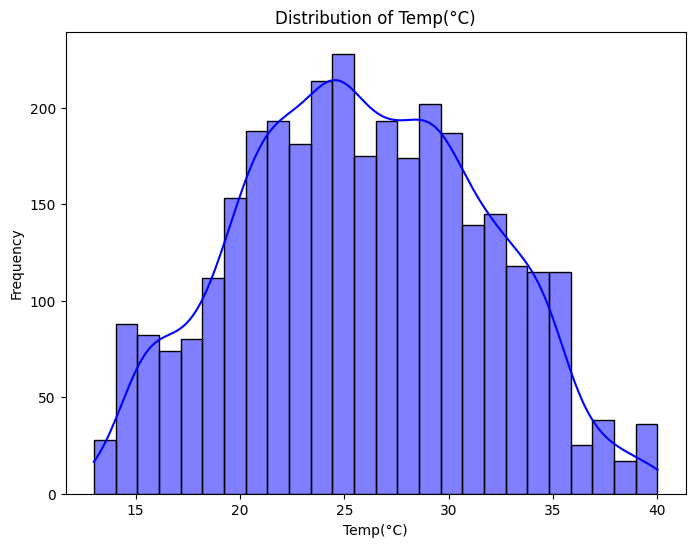

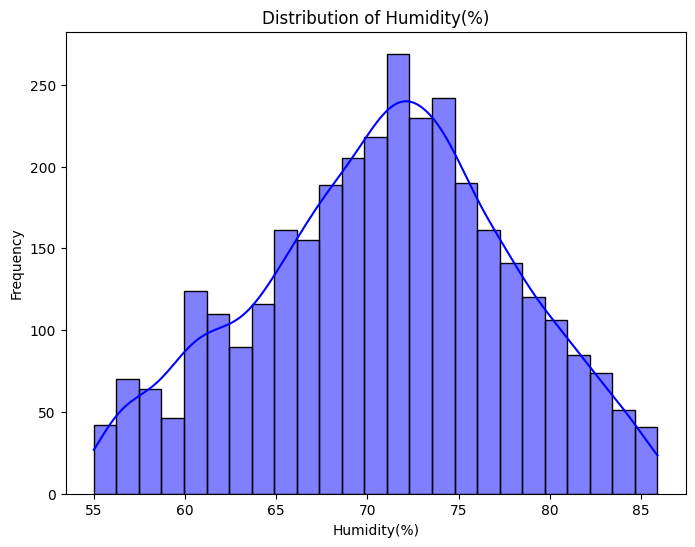

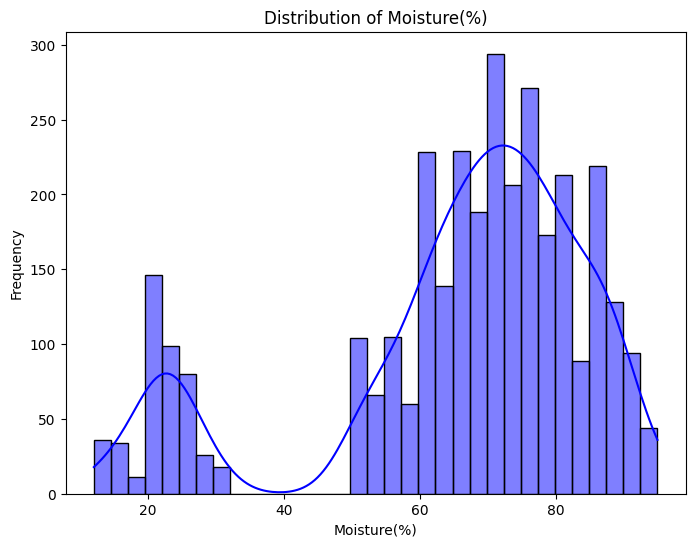

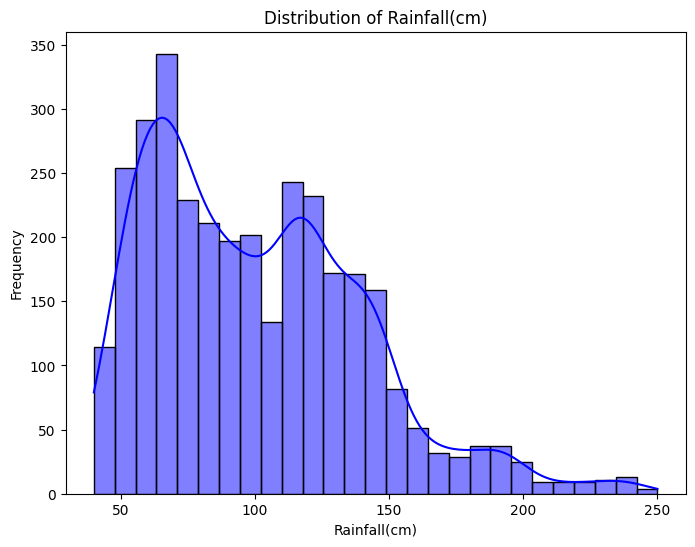

In [ ]:
# Histogram with Seaborn
numerical_features = df.select_dtypes(include=np.number)
for col in numerical_features.columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[col], kde=True, color='blue')
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()


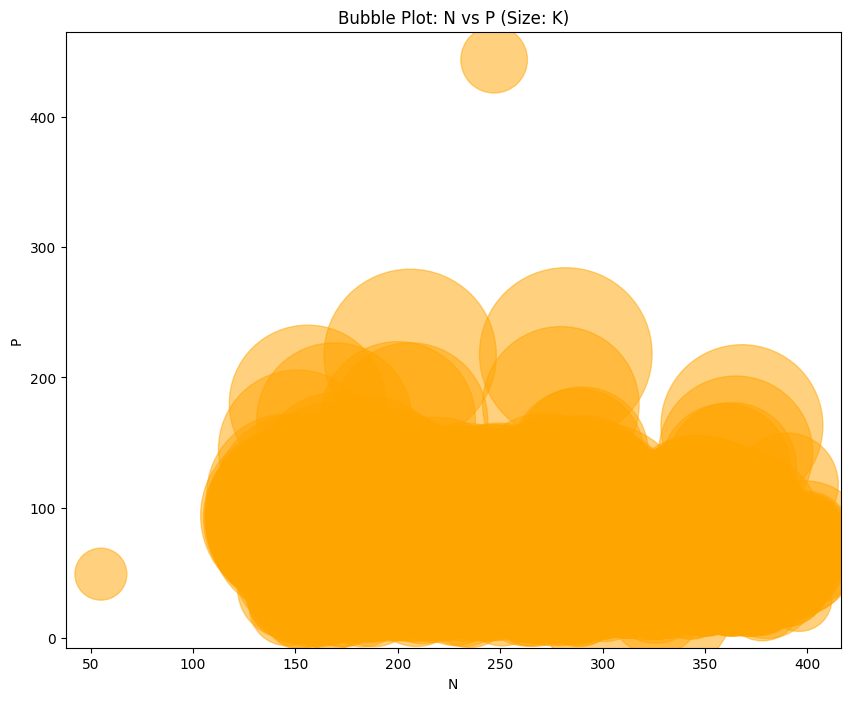

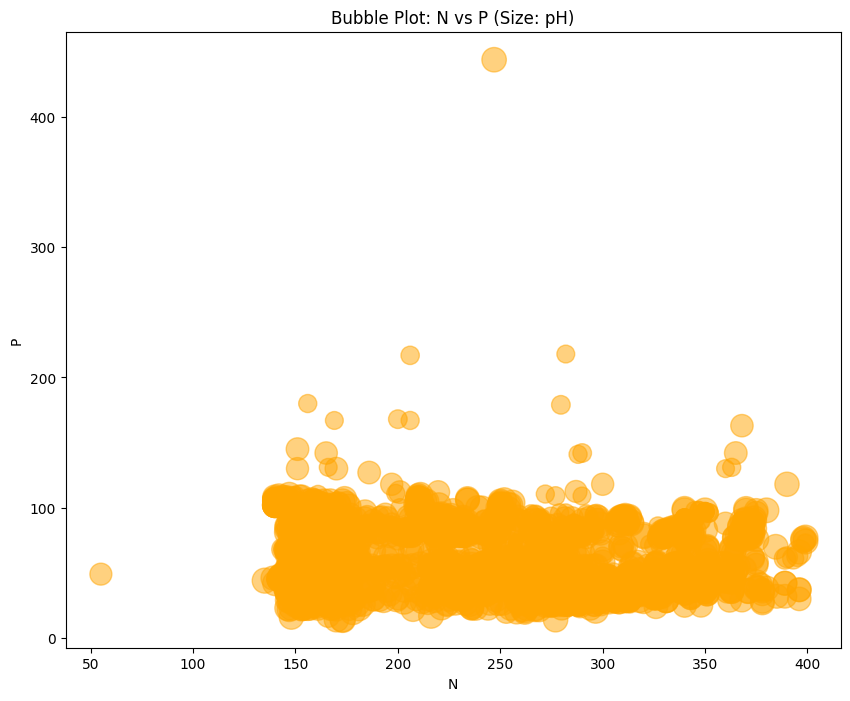

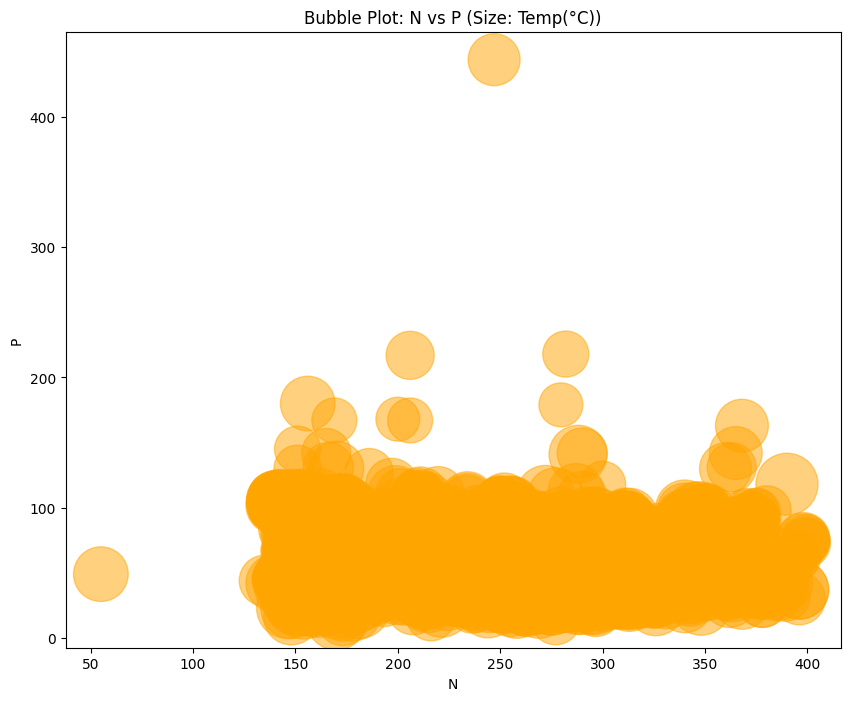

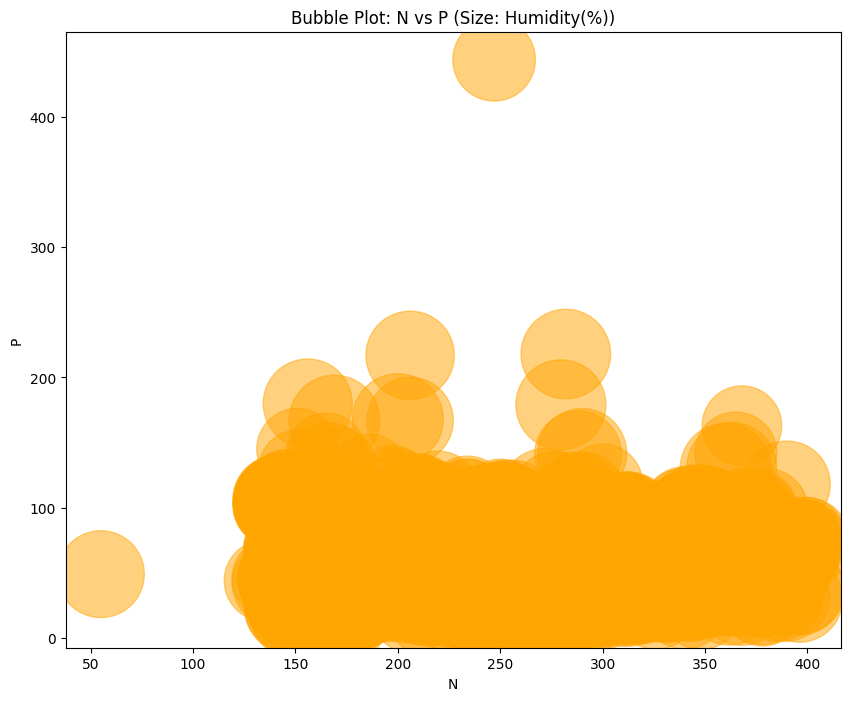

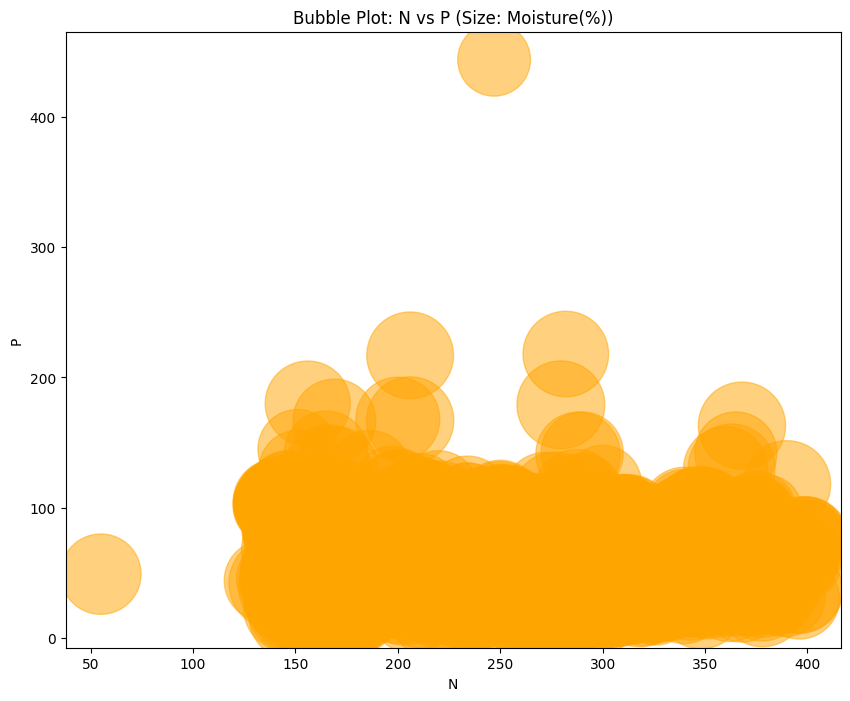

...

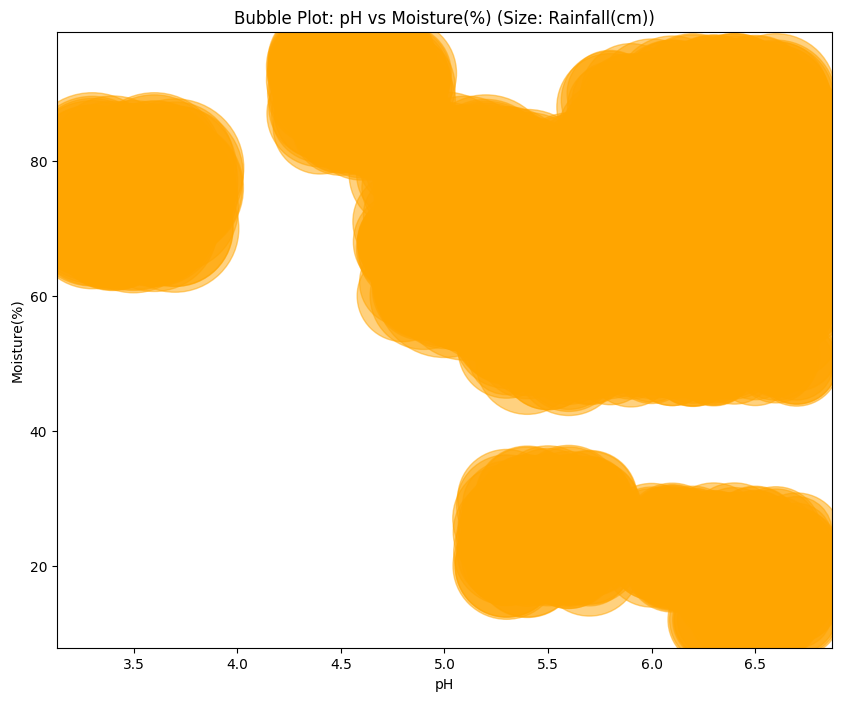

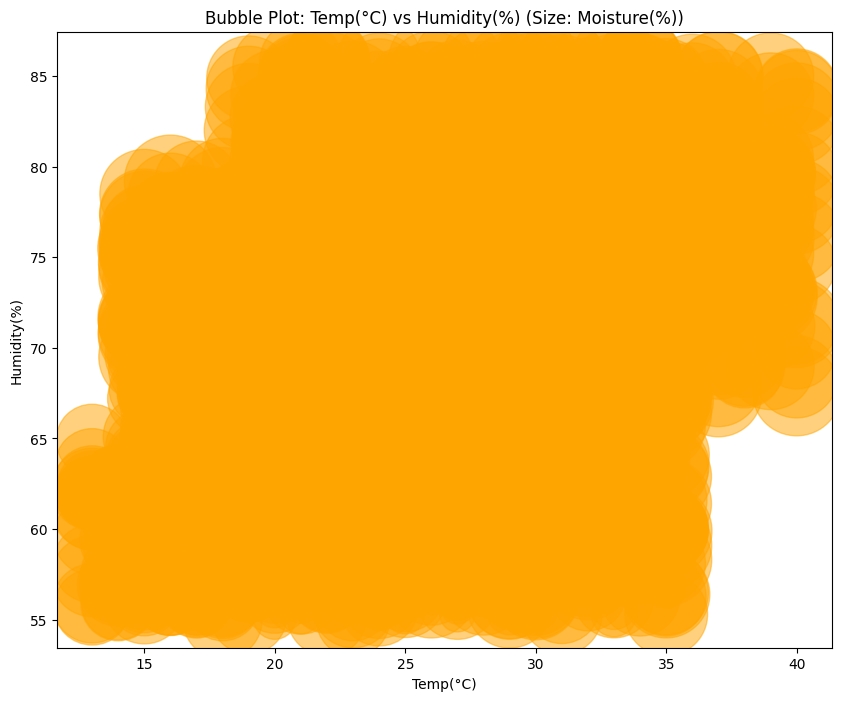

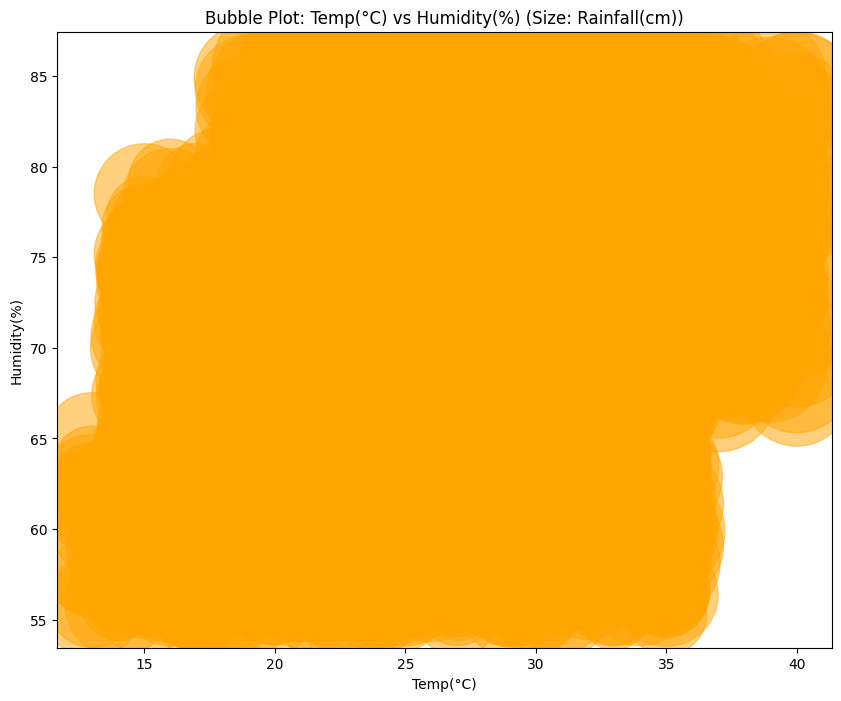

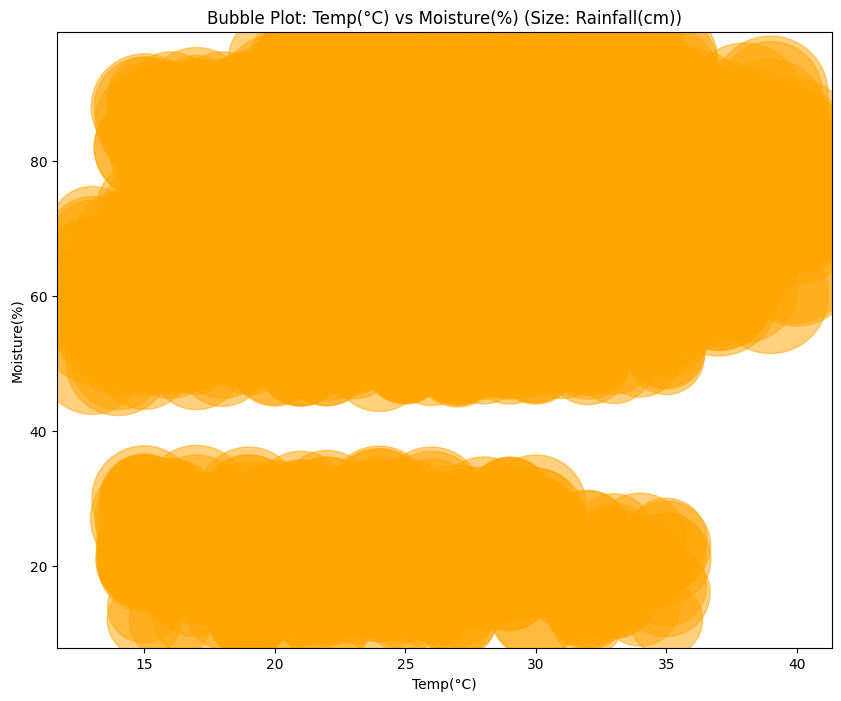

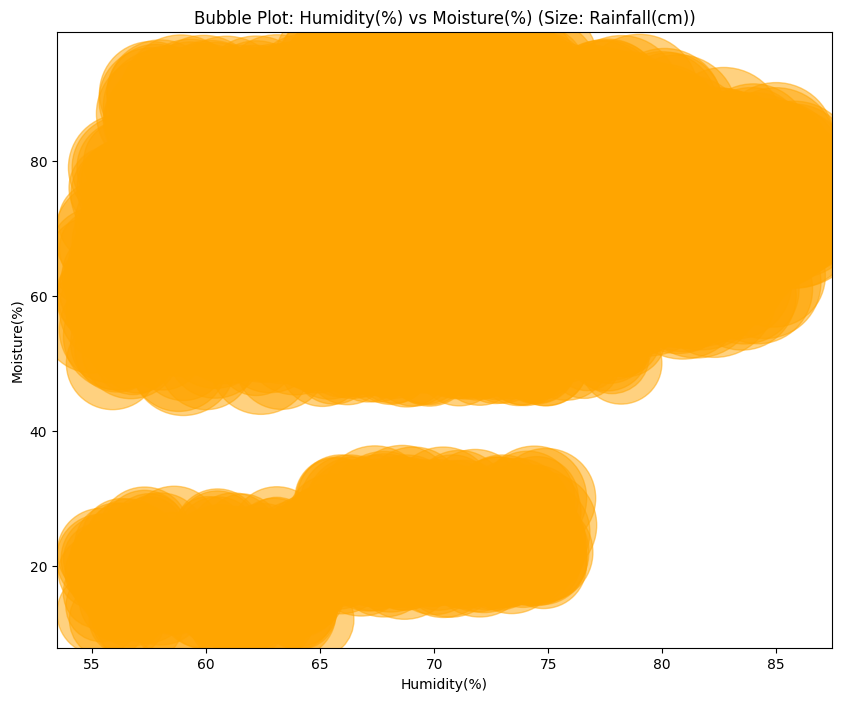

In [ ]:
import itertools
import matplotlib.pyplot as plt

# List of your features
features = ['N', 'P', 'K', 'pH', 'Temp(°C)', 'Humidity(%)', 'Moisture(%)', 'Rainfall(cm)']

# Generate combinations of features for X, Y, and Size (bubble size)
combinations = list(itertools.combinations(features, 3))  # Choose 3 at a time (X, Y, and Size)

# Create bubble plots for each combination
for combo in combinations:
    x = df[combo[0]]  # Feature for X-axis
    y = df[combo[1]]  # Feature for Y-axis  # Changed index to 1
    size = df[combo[2]]  # Feature for bubble size # Changed index to 2

    plt.figure(figsize=(10, 8))
    plt.scatter(x, y, s=size*50, alpha=0.5, color='orange')  # Adjust bubble scaling with `size*50`
    plt.title(f"Bubble Plot: {combo[0]} vs {combo[1]} (Size: {combo[2]})")
    plt.xlabel(combo[0])
    plt.ylabel(combo[1])
    plt.show()

<ipython-input-25-e2e93bc5478f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_numerical['Category'] = 'Group1'


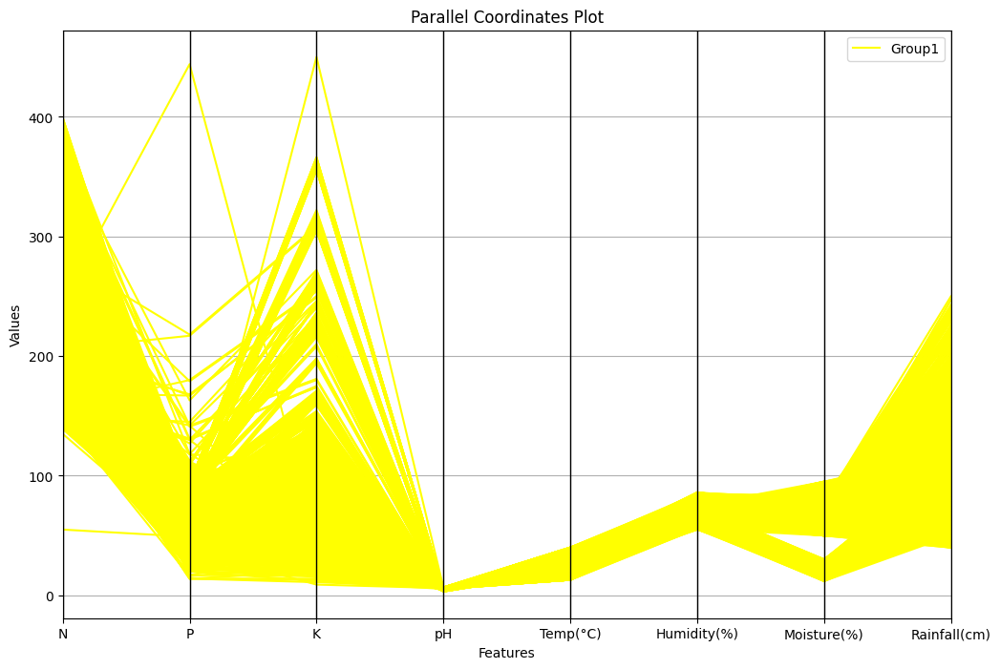

In [ ]:
from pandas.plotting import parallel_coordinates

# Select only numerical features for the parallel coordinates plot
numerical_features = df.select_dtypes(include=np.number).columns
df_numerical = df[numerical_features]

# Add a categorical column for grouping if needed (optional)
df_numerical['Category'] = 'Group1'

# Plot parallel coordinates using only numerical data
plt.figure(figsize=(12, 8))
parallel_coordinates(df_numerical, 'Category', color=['yellow', 'orange'])
plt.title("Parallel Coordinates Plot")
plt.xlabel("Features")
plt.ylabel("Values")
plt.show()

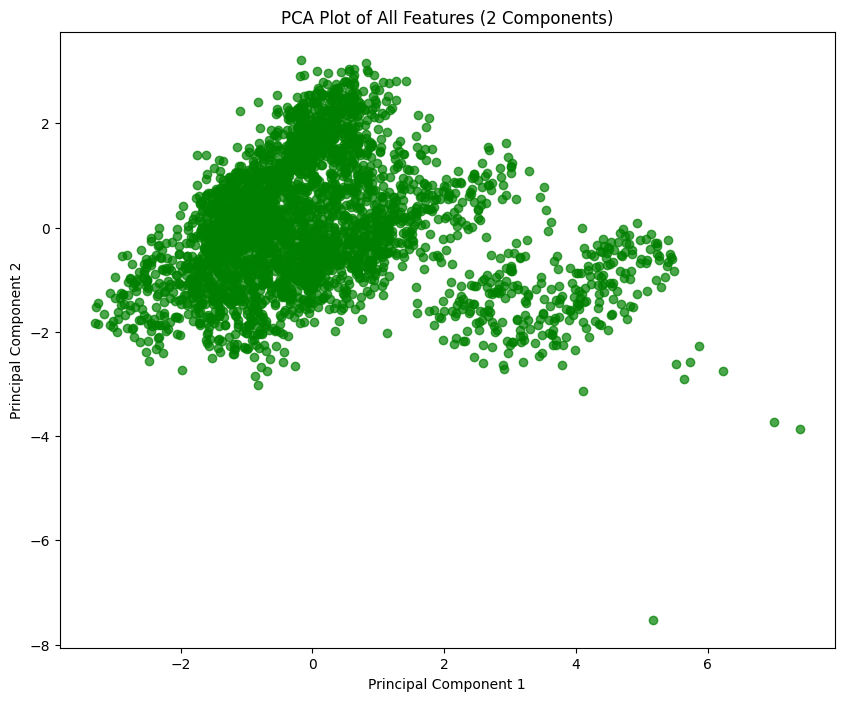

In [ ]:
from sklearn.decomposition import PCA

# Normalize the data (optional, depending on the scale of features)
from sklearn.preprocessing import StandardScaler
scaled_data = StandardScaler().fit_transform(df[['N', 'P', 'K', 'pH', 'Temp(°C)', 'Humidity(%)', 'Moisture(%)', 'Rainfall(cm)']])

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Plot the PCA result
plt.figure(figsize=(10, 8))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.7, c='green')
plt.title("PCA Plot of All Features (2 Components)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()


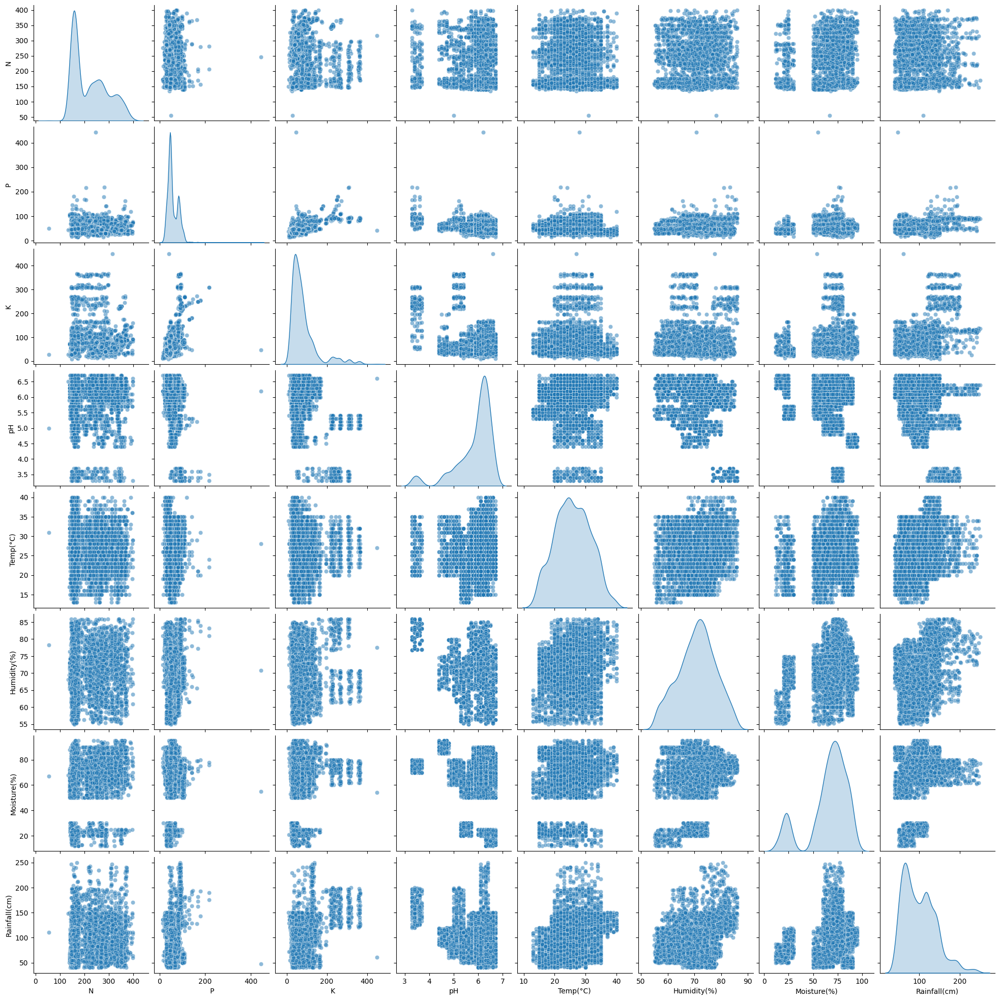

In [ ]:
# Pairplot with Seaborn
selected_features = ['N','P','K','pH','Temp(°C)','Humidity(%)','Moisture(%)','Rainfall(cm)']
sns.pairplot(df[selected_features], diag_kind="kde", plot_kws={'alpha': 0.5})
plt.show()

Missing values:
 N               0
P               0
K               0
pH              0
Temp(°C)        0
Humidity(%)     0
Moisture(%)     0
Rainfall(cm)    0
Crop            0
dtype: int64

Summary statistics:
                  N            P            K           pH    Temp(°C)  \
count  3300.000000  3300.000000  3300.000000  3300.000000  3300.00000   
mean    223.727909    57.865758    81.821818     5.854636    25.86000   
std      70.689646    23.486225    66.377865     0.734418     5.73982   
min      55.000000    14.000000     9.000000     3.300000    13.00000   
25%     160.000000    43.000000    39.000000     5.600000    22.00000   
50%     210.000000    49.000000    61.000000     6.100000    26.00000   
75%     275.000000    78.000000    93.000000     6.300000    30.00000   
max     399.000000   444.000000   450.000000     6.700000    40.00000   

       Humidity(%)  Moisture(%)  Rainfall(cm)  
count  3300.000000  3300.000000   3300.000000  
mean     70.890485    65.591212 

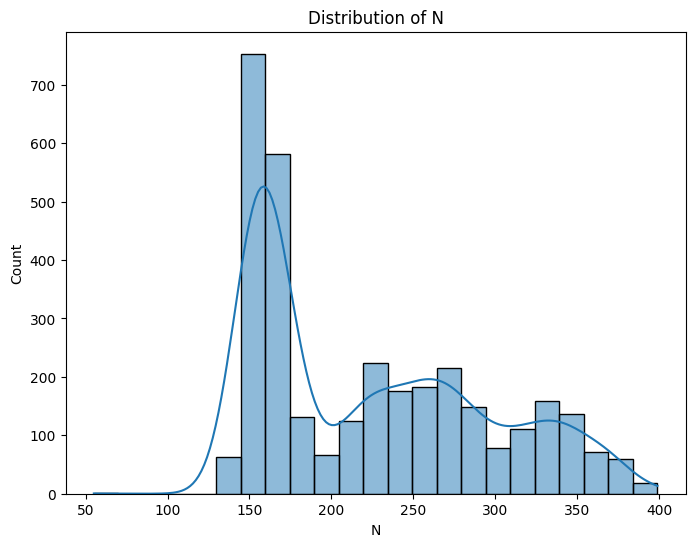

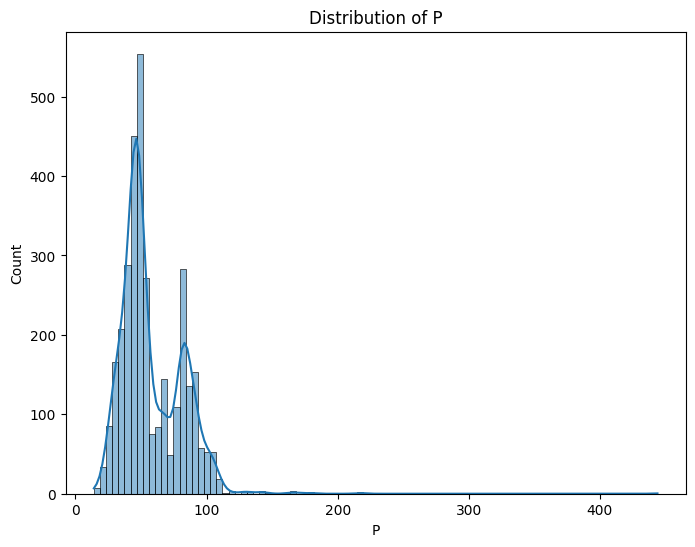

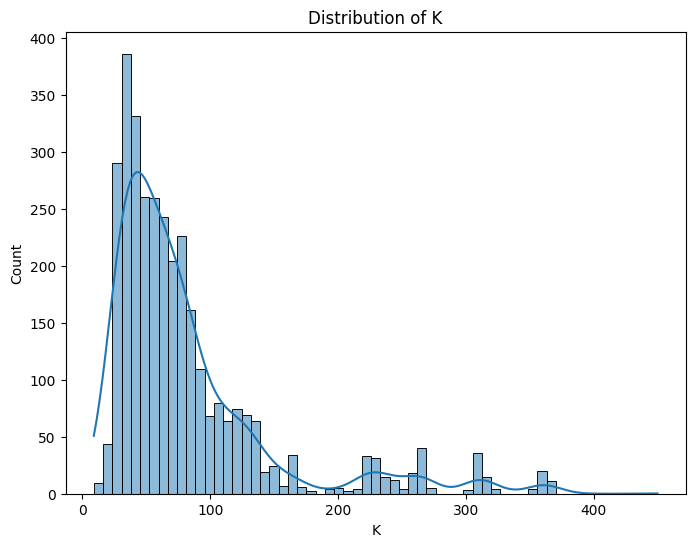

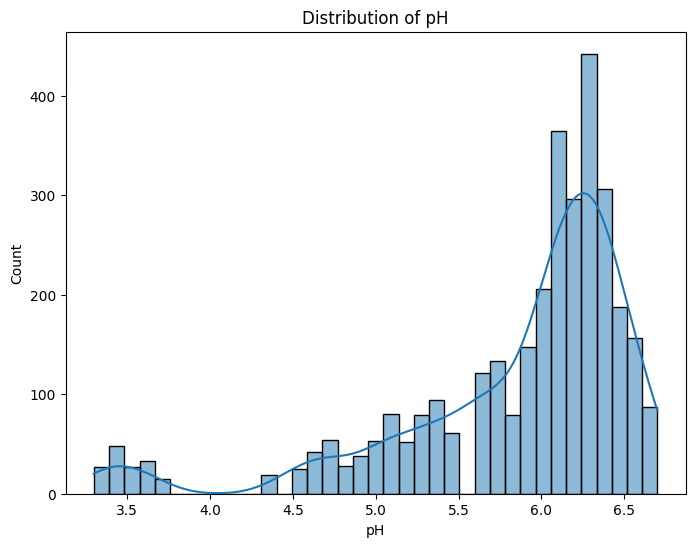

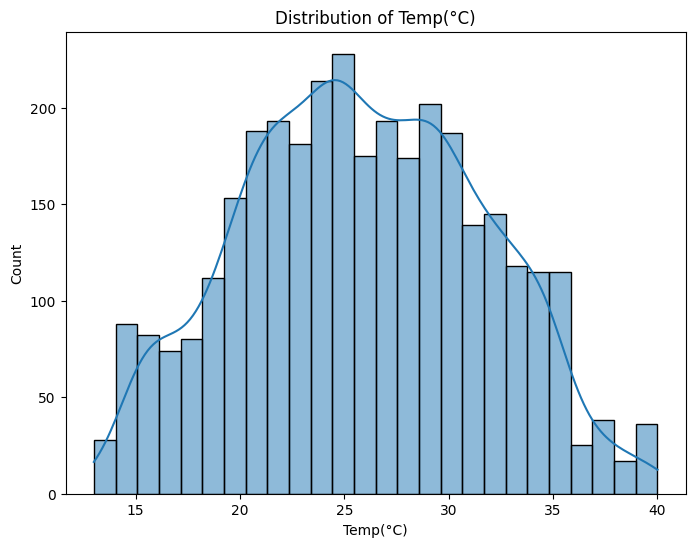

...

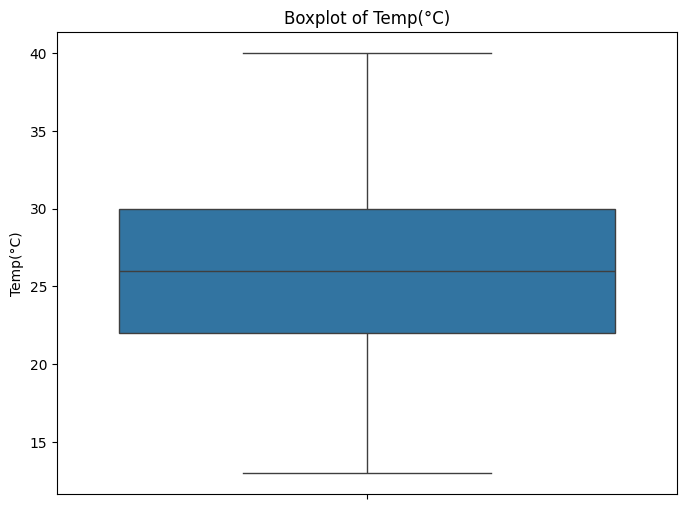

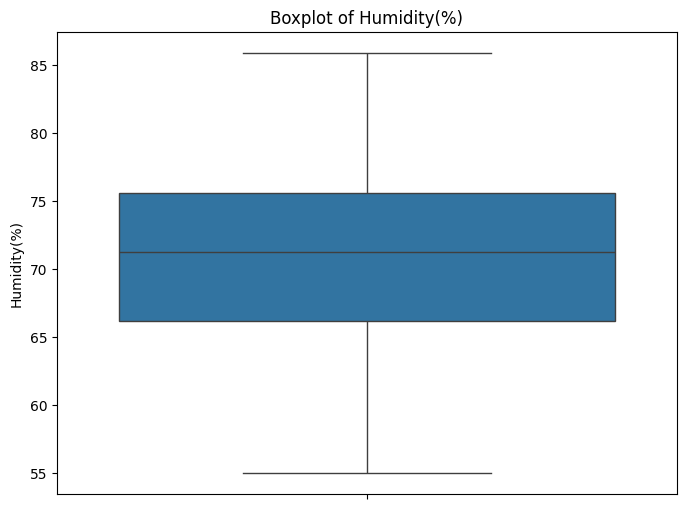

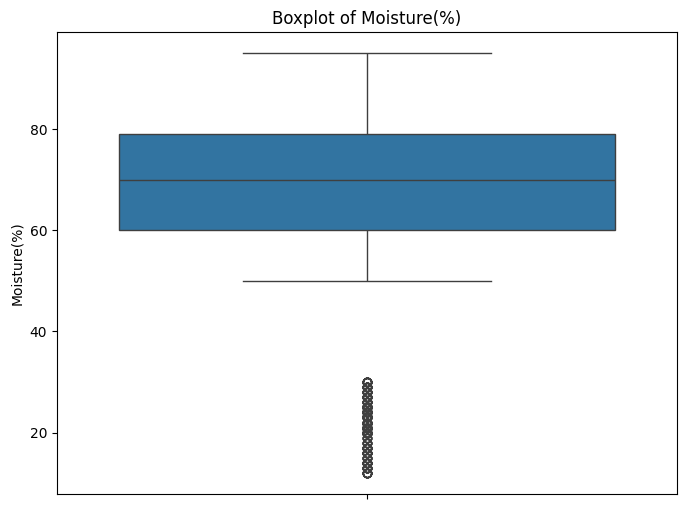

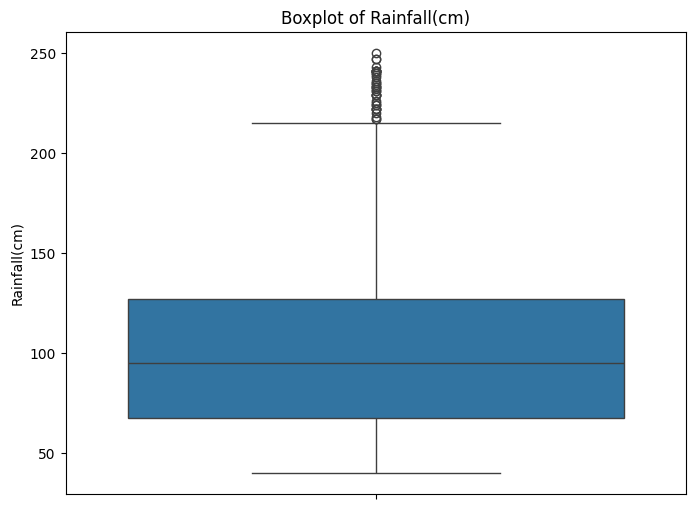

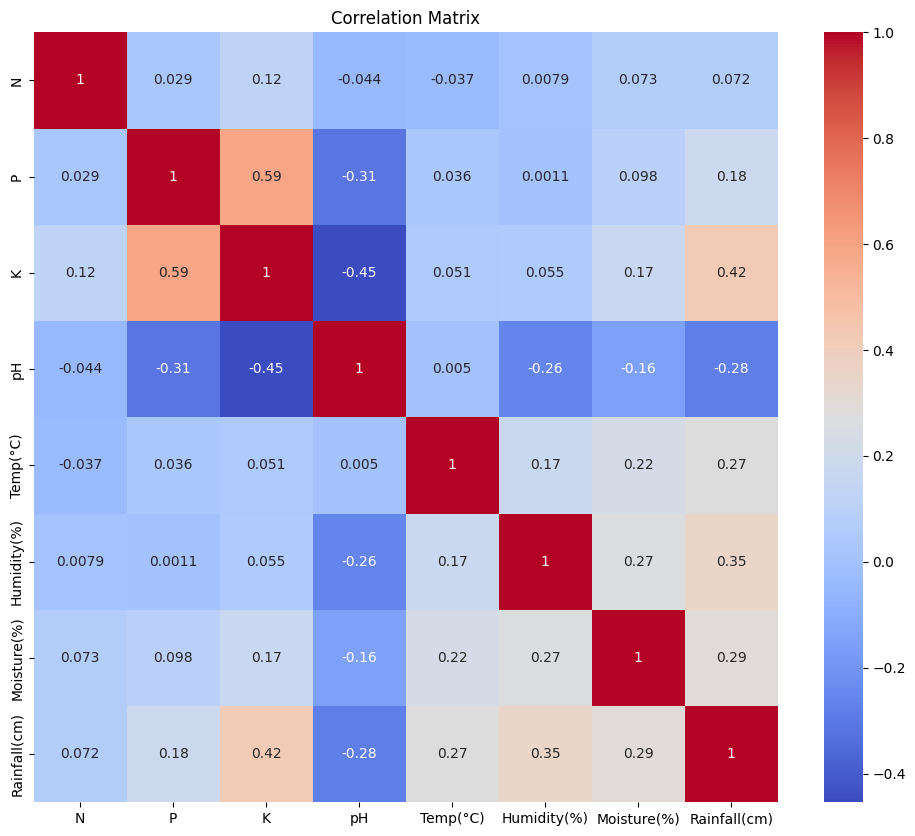

One or more selected features not found in the DataFrame.


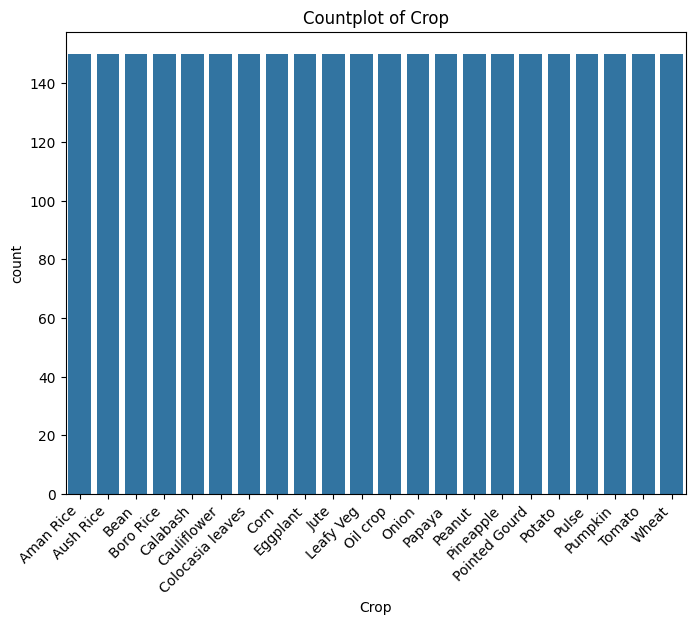

In [ ]:
# prompt: generate eda plots

# Check for missing values
missing_values = df.isnull().sum()
print("Missing values:\n", missing_values)

# Summary statistics
summary_stats = df.describe()
print("\nSummary statistics:\n", summary_stats)

# Histograms for numerical features
numerical_features = df.select_dtypes(include=np.number)
for col in numerical_features.columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col}")
    plt.show()

# Boxplots for numerical features
for col in numerical_features.columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(y=df[col])
    plt.title(f"Boxplot of {col}")
    plt.show()

# Select only numerical columns for correlation calculation
numerical_df = df.select_dtypes(include=np.number)

# Calculate the correlation matrix for numerical features
plt.figure(figsize=(12, 10))
sns.heatmap(numerical_df.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()


# Pairplot for selected numerical features (adjust as needed)
selected_features = ['feature1', 'feature2', 'feature3']  # Replace with your feature names
if all(feature in df.columns for feature in selected_features):
    sns.pairplot(df[selected_features])
    plt.show()
else:
    print("One or more selected features not found in the DataFrame.")

# Countplots for categorical features
categorical_features = df.select_dtypes(include=['object', 'category'])
for col in categorical_features.columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=df[col])
    plt.title(f"Countplot of {col}")
    plt.xticks(rotation=45, ha='right')
    plt.show()

In [ ]:
import pandas as pd
from tabulate import tabulate
description = df.describe()

# Convert to a table
table = tabulate(description, headers="keys", tablefmt="grid")

# Print the table
print(table)

+-------+-----------+-----------+-----------+-------------+------------+---------------+---------------+----------------+
|       |         N |         P |         K |          pH |   Temp(°C) |   Humidity(%) |   Moisture(%) |   Rainfall(cm) |
+=======+===========+===========+===========+=============+============+===============+===============+================+
| count | 3300      | 3300      | 3300      | 3300        | 3300       |    3300       |     3300      |      3300      |
+-------+-----------+-----------+-----------+-------------+------------+---------------+---------------+----------------+
| mean  |  223.728  |   57.8658 |   81.8218 |    5.85464  |   25.86    |      70.8905  |       65.5912 |       100.575  |
+-------+-----------+-----------+-----------+-------------+------------+---------------+---------------+----------------+
| std   |   70.6896 |   23.4862 |   66.3779 |    0.734418 |    5.73982 |       6.91895 |       20      |        40.1172 |
+-------+-----------+---

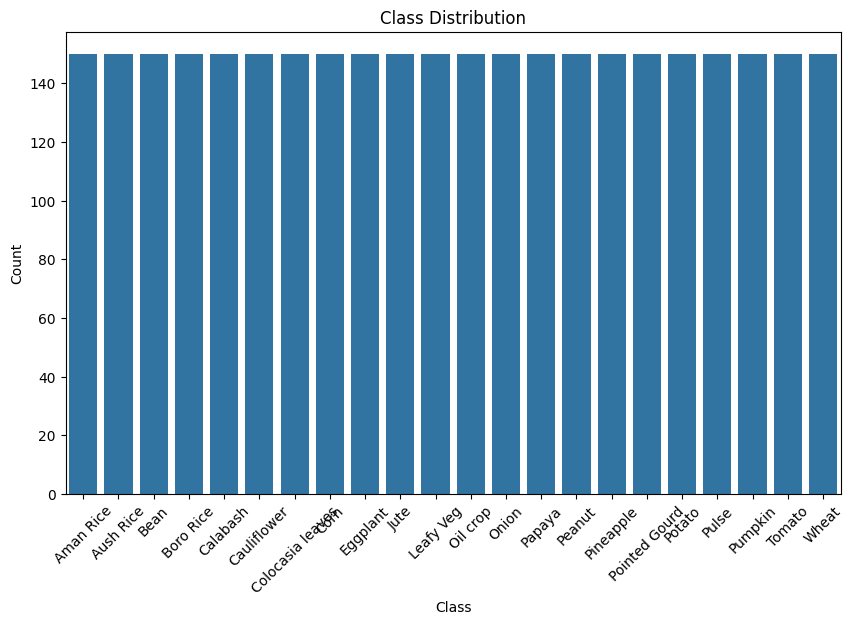

In [ ]:
# Assuming your DataFrame is named df and the class column is 'Crop' or another relevant column
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Crop')  # Replace 'Crop' with the name of your class column
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate labels if they are long
plt.show()

In [ ]:
df.tail()

,N,P,K,pH,Temp(°C),Humidity(%),Moisture(%),Rainfall(cm),Crop
3295,174.0,29.0,49,6.7,34,58.0,24,87,Wheat
3296,162.0,47.0,34,6.6,22,64.8,24,74,Wheat
3297,270.0,46.0,60,6.7,29,58.6,20,75,Wheat
3298,353.0,44.0,82,6.4,15,57.5,25,51,Wheat
3299,174.0,50.0,107,6.6,21,57.4,18,63,Wheat


In [ ]:
for column in df.columns:
    print(f"{column}: {df[column].dtype}")

N: float64
P: float64
K: int64
pH: float64
Temp(°C): int64
Humidity(%): float64
Moisture(%): int64
Rainfall(cm): int64
Crop: object


In [ ]:
columns_with_null = df.isnull().sum()

print(columns_with_null)

N               0
P               0
K               0
pH              0
Temp(°C)        0
Humidity(%)     0
Moisture(%)     0
Rainfall(cm)    0
Crop            0
dtype: int64


In [ ]:
df['Crop'].unique()

array(['Aman Rice', 'Aush Rice', 'Bean', 'Boro Rice', 'Calabash',
       'Cauliflower', 'Colocasia leaves', 'Corn', 'Eggplant', 'Jute',
       'Leafy Veg', 'Oil crop', 'Onion', 'Papaya', 'Peanut', 'Pineapple',
       'Pointed Gourd', 'Potato', 'Pulse', 'Pumpkin', 'Tomato', 'Wheat'],
      dtype=object)

In [ ]:
len(df['Crop'].unique())

22

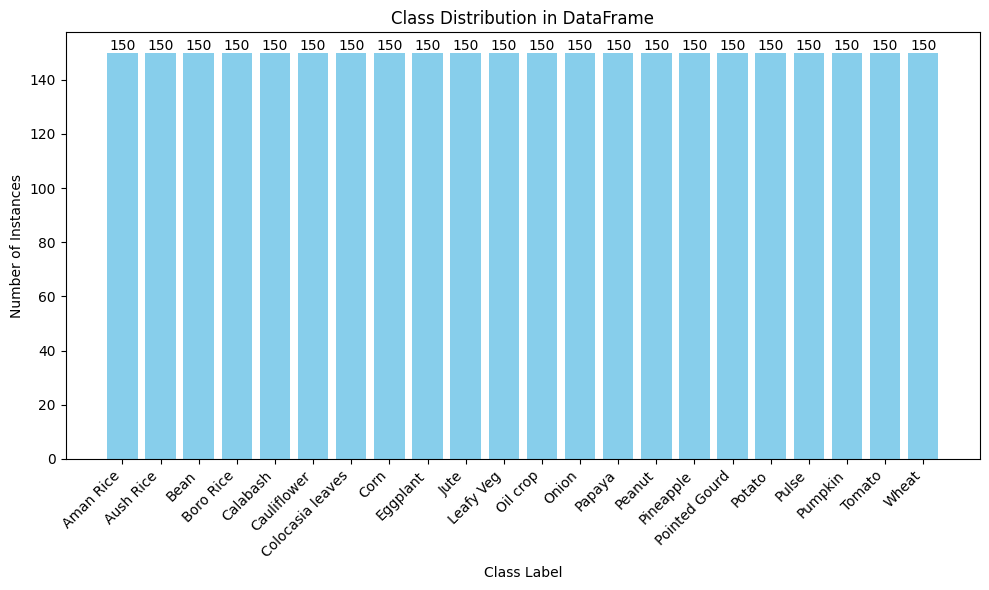

In [ ]:
import matplotlib.pyplot as plt

class_counts = df['Crop'].value_counts().sort_values(ascending=False)

# Create a bar chart
plt.figure(figsize=(10, 6))  # Adjust figure size for better readability
bars = plt.bar(class_counts.index, class_counts.values, color='skyblue')

# Handle potential label overlapping
if len(class_counts) > 10:  # Adjust threshold based on your needs
    plt.xticks(rotation=45, ha='right')  # Rotate and right-align x-axis labels
else:
    plt.xticks(rotation=0)  # No rotation if fewer labels

# Add counts on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval),
             ha='center', va='bottom', fontsize=10)

# Customize the plot for better readability
plt.xlabel('Class Label')
plt.ylabel('Number of Instances')
plt.title('Class Distribution in DataFrame')
plt.tight_layout()

# Display the plot
plt.savefig('Class_Distribution.png')
plt.show()


In [ ]:
from sklearn.preprocessing import MinMaxScaler
import joblib
import joblib
# Select only numerical columns for scaling
columns_to_scale =['N','P','K','pH','Temp(°C)','Humidity(%)','Moisture(%)','Rainfall(cm)']

scaler = MinMaxScaler()

# Apply scaling to the selected columns and assign them back to the DataFrame
df_scaled = df.copy()
df_scaled[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])

joblib.dump(scaler, 'scaler.pkl')


# Display the scaled DataFrame
df_scaled.head()

,N,P,K,pH,Temp(°C),Humidity(%),Moisture(%),Rainfall(cm),Crop
0,0.264535,0.069767,0.038549,0.852941,0.666667,0.679612,0.831325,0.400000,Aman Rice
1,0.505814,0.048837,0.049887,0.823529,0.333333,0.592233,0.722892,0.461905,Aman Rice
2,0.656977,0.027907,0.058957,0.794118,0.703704,0.792880,0.891566,0.400000,Aman Rice
3,0.308140,0.020930,0.074830,0.852941,0.851852,0.543689,0.891566,0.500000,Aman Rice
4,0.290698,0.072093,0.056689,0.882353,0.333333,0.582524,0.710843,0.495238,Aman Rice


In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

# Encode categorical columns
df_scaled['label_encoded'] = label_encoder.fit_transform(df_scaled['Crop'])
df_scaled.drop(columns=['Crop'], inplace=True)
joblib.dump(label_encoder, 'label_encoder.pkl')


['label_encoder.pkl']

In [ ]:
df_scaled.head()

,N,P,K,pH,Temp(°C),Humidity(%),Moisture(%),Rainfall(cm),label_encoded
0,0.264535,0.069767,0.038549,0.852941,0.666667,0.679612,0.831325,0.400000,0
1,0.505814,0.048837,0.049887,0.823529,0.333333,0.592233,0.722892,0.461905,0
2,0.656977,0.027907,0.058957,0.794118,0.703704,0.792880,0.891566,0.400000,0
3,0.308140,0.020930,0.074830,0.852941,0.851852,0.543689,0.891566,0.500000,0
4,0.290698,0.072093,0.056689,0.882353,0.333333,0.582524,0.710843,0.495238,0


In [ ]:
x = df_scaled.drop(columns = ['label_encoded'])

y = df_scaled['label_encoded']

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.20, stratify=y, random_state=42)

In [ ]:
X_train.shape, X_test.shape

((2640, 8), (660, 8))

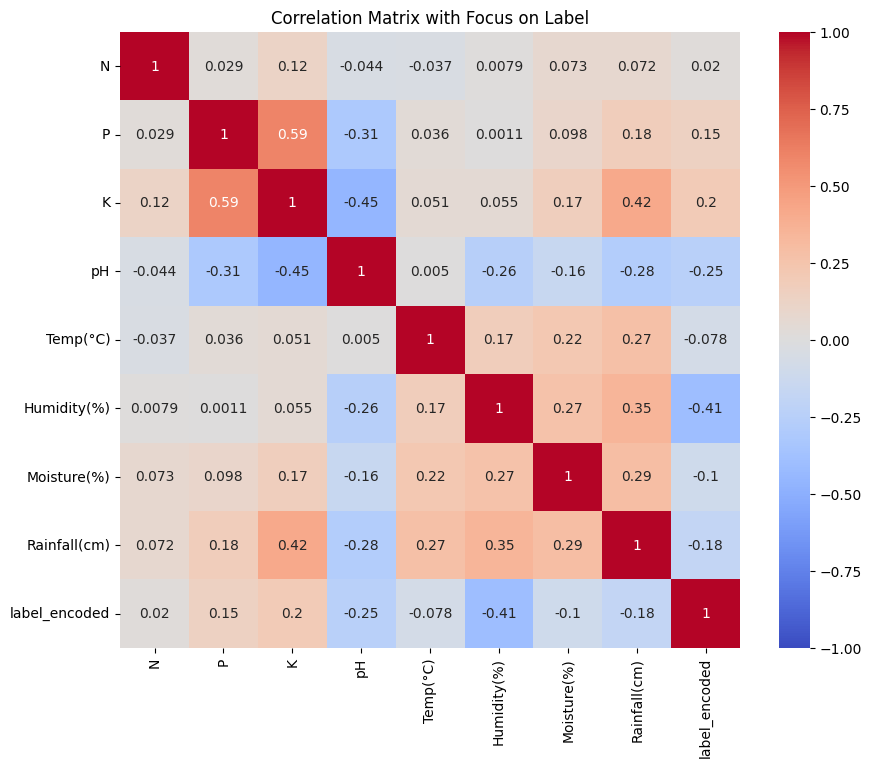

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_scaled is defined and includes the 'label_encoded' column
label_corr = df_scaled.corr()['label_encoded'].drop('label_encoded')

corr_matrix = df_scaled.corr()

# Plot the correlation matrix focusing on the label
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix with Focus on Label')

# Save the figure
plt.savefig('correlation_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, precision_recall_fscore_support
from sklearn import metrics
import time

def Results(clf):
    clf.fit(X_train, y_train)  # Train the model

    # Measure inference time for training predictions
    start_time = time.time()
    train_predictions = clf.predict(X_train)
    train_inference_time = time.time() - start_time

    # Measure inference time for test predictions
    start_time = time.time()
    predictions = clf.predict(X_test)
    test_inference_time = time.time() - start_time

    # Print classifier details
    print("Classifier: ", clf)

    # Accuracy
    print('Train Accuracy: ', "{:.3f}".format(accuracy_score(y_train, train_predictions)))
    print('Test Accuracy: ', "{:.3f}".format(accuracy_score(y_test, predictions)))

    # Precision, Recall, F1-Score
    train_precision, train_recall, train_f1, _ = precision_recall_fscore_support(y_train, train_predictions, average='weighted')
    test_precision, test_recall, test_f1, _ = precision_recall_fscore_support(y_test, predictions, average='weighted')

    print('Train Precision:', "{:.3f}".format(train_precision))
    print('Train Recall:', "{:.3f}".format(train_recall))
    print('Train F1 Score:', "{:.3f}".format(train_f1))

    print('Test Precision:', "{:.3f}".format(test_precision))
    print('Test Recall:', "{:.3f}".format(test_recall))
    print('Test F1 Score:', "{:.3f}".format(test_f1))

    # Inference time
    print(f"Train Inference Time: {train_inference_time:.6f} seconds")
    print(f"Test Inference Time: {test_inference_time:.6f} seconds")

    # Classification report
    print(classification_report(y_test, predictions))

    # Separator for readability
    print('─' * 60)


**Run All the ML Model**

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier

# Set random seed
random_seed = 42

# Initialize classifiers with default parameters
dt = DecisionTreeClassifier(random_state=random_seed)
rf = RandomForestClassifier(random_state=random_seed)
nb = GaussianNB()  # GaussianNB does not have a random_state parameter
lr = LogisticRegression(random_state=random_seed)
svc = SVC(random_state=random_seed)
knn = KNeighborsClassifier()  # KNeighborsClassifier does not have a random_state parameter
adaboost = AdaBoostClassifier(random_state=random_seed)
xgboost = XGBClassifier(random_state=random_seed)
gboost = GradientBoostingClassifier(random_state=random_seed)

# List of all classifiers including both normal and tuned versions
classifiers = [dt, rf,  nb, lr, svc, knn, adaboost, xgboost, gboost]

# Run results function on each classifier
for clf in classifiers:
    Results(clf)


Classifier:  DecisionTreeClassifier(random_state=42)
Train Accuracy:  1.000
Test Accuracy:  0.930
Train Precision: 1.000
Train Recall: 1.000
Train F1 Score: 1.000
Test Precision: 0.933
Test Recall: 0.930
Test F1 Score: 0.930
Train Inference Time: 0.003406 seconds
Test Inference Time: 0.002641 seconds
              precision    recall  f1-score   support

           0       0.73      0.63      0.68        30
           1       0.90      0.90      0.90        30
           2       0.87      0.87      0.87        30
           3       0.66      0.77      0.71        30
           4       1.00      1.00      1.00        30
           5       0.94      1.00      0.97        30
           6       0.90      0.87      0.88        30
           7       1.00      0.80      0.89        30
           8       0.94      0.97      0.95        30
           9       1.00      1.00      1.00        30
          10       0.82      0.93      0.88        30
          11       0.97      0.93      0.95      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/m

Classifier:  XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)
Train Accuracy:  1.000
Test Accuracy:  0.956
Train Precision: 1.000
Train Recall: 1.000
Train F1 Score: 1.000
Test Precision: 0.958
Test Recall: 0.956
Test F1 Score: 0.956
Train Inference Time: 0.140162 seconds
Test Infe

**DT Hyperparameter tuning**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Define the parameter grid
param_grid = {
    'criterion': ['gini', 'entropy'],            # Split quality measure
    'max_depth': [3, 5, 10, None],              # Depth of the tree
    'min_samples_split': [2, 5, 10],            # Minimum samples to split a node
    'min_samples_leaf': [1, 2, 4],              # Minimum samples in a leaf node
    'max_features': [None, 'sqrt', 'log2']      # Features considered for splits
}

# Initialize the DecisionTreeClassifier with random seed
dt = DecisionTreeClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid,
                           scoring='accuracy', cv=5, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and their corresponding score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Print the classification report
print("\nClassification Report on Test Data:")
print(classification_report(y_test, y_pred))


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Cross-Validation Score: 0.9166666666666666

Classification Report on Test Data:
              precision    recall  f1-score   support

           0       0.78      0.83      0.81        30
           1       0.87      0.90      0.89        30
           2       0.85      0.77      0.81        30
           3       0.81      0.87      0.84        30
           4       1.00      1.00      1.00        30
           5       0.94      1.00      0.97        30
           6       0.96      0.83      0.89        30
           7       1.00      0.83      0.91        30
           8       0.94      1.00      0.97        30
           9       0.91      0.97      0.94        30
          10       0.90      0.87      0.88        30
          11       0.94      0.97      0.95        30
          12      

In [ ]:
Results(DecisionTreeClassifier(
    criterion='entropy',
    max_depth=None,
    max_features=None,
    min_samples_leaf=1,
    min_samples_split=2,
    random_state=42  # Optional: Ensures reproducibility
))

Classifier:  DecisionTreeClassifier(criterion='entropy', random_state=42)
Train Accuracy:  1.000
Test Accuracy:  0.938
Train Precision: 1.000
Train Recall: 1.000
Train F1 Score: 1.000
Test Precision: 0.940
Test Recall: 0.938
Test F1 Score: 0.938
Train Inference Time: 0.002263 seconds
Test Inference Time: 0.001998 seconds
              precision    recall  f1-score   support

           0       0.78      0.83      0.81        30
           1       0.87      0.90      0.89        30
           2       0.85      0.77      0.81        30
           3       0.81      0.87      0.84        30
           4       1.00      1.00      1.00        30
           5       0.94      1.00      0.97        30
           6       0.96      0.83      0.89        30
           7       1.00      0.83      0.91        30
           8       0.94      1.00      0.97        30
           9       0.91      0.97      0.94        30
          10       0.90      0.87      0.88        30
          11       0.94     

**RF Hyperparameter tuning**

In [ ]:
import time
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
import pandas as pd

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],            # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],            # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],            # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],              # Minimum samples required at a leaf node
    'max_features': ['sqrt', 'log2'],           # Number of features to consider for splits
}

# Initialize the RandomForestClassifier with a random seed
rf = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                           scoring='accuracy', cv=5, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and their corresponding score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_

# Measure inference time for predictions
start_time = time.time()  # Start time for inference
y_pred = best_model.predict(X_test)
end_time = time.time()  # End time for inference

# Calculate inference time
inference_time = end_time - start_time
print(f"Inference Time: {inference_time:.4f} seconds")

# Get the classification report as a dictionary
report = classification_report(y_test, y_pred, output_dict=True)

# Convert the dictionary to a DataFrame for easier formatting
report_df = pd.DataFrame(report).transpose()

# Format the DataFrame to display values with 3 decimal points
formatted_report = report_df.round(3)

# Print the formatted classification report
print("\nFormatted Classification Report:")
print(formatted_report)


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best Cross-Validation Score: 0.9579545454545453
Inference Time: 0.0392 seconds

Formatted Classification Report:
              precision  recall  f1-score  support
0                 0.818   0.900     0.857   30.000
1                 0.929   0.867     0.897   30.000
2                 0.818   0.900     0.857   30.000
3                 0.875   0.933     0.903   30.000
4                 1.000   1.000     1.000   30.000
5                 1.000   1.000     1.000   30.000
6                 1.000   0.867     0.929   30.000
7                 0.960   0.800     0.873   30.000
8                 1.000   0.967     0.983   30.000
9                 0.968   1.000     0.984   30.000
10                0.933   0.933     0.933   30.000
11                0.933   0.933     0.933   30.000
12                1.000   1.000

In [ ]:
Results(RandomForestClassifier(
    max_depth=None,
    max_features='sqrt',
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=200,
    random_state=42  # Optional for reproducibility
))

Classifier:  RandomForestClassifier(n_estimators=200, random_state=42)
Train Accuracy:  1.000
Test Accuracy:  0.958
Train Precision: 1.000
Train Recall: 1.000
Train F1 Score: 1.000
Test Precision: 0.960
Test Recall: 0.958
Test F1 Score: 0.958
Train Inference Time: 0.139420 seconds
Test Inference Time: 0.060821 seconds
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        30
           1       0.93      0.87      0.90        30
           2       0.82      0.90      0.86        30
           3       0.88      0.93      0.90        30
           4       1.00      1.00      1.00        30
           5       1.00      1.00      1.00        30
           6       1.00      0.87      0.93        30
           7       0.96      0.80      0.87        30
           8       1.00      0.97      0.98        30
           9       0.97      1.00      0.98        30
          10       0.93      0.93      0.93        30
          11       0.93      0.

**NB Hyperparameter tuning**

In [ ]:
import time
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
import pandas as pd

# Define the parameter grid for Naive Bayes (NB)
param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]  # Variance smoothing for GaussianNB
}

# Initialize the Gaussian Naive Bayes classifier with a random seed
nb = GaussianNB()

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=nb, param_grid=param_grid,
                           scoring='accuracy', cv=5, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and their corresponding score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_

# Measure inference time for predictions
start_time = time.time()  # Start time for inference
y_pred = best_model.predict(X_test)
end_time = time.time()  # End time for inference

# Calculate inference time
inference_time = end_time - start_time
print(f"Inference Time: {inference_time:.4f} seconds")

# Get the classification report as a dictionary
report = classification_report(y_test, y_pred, output_dict=True)

# Convert the dictionary to a DataFrame for easier formatting
report_df = pd.DataFrame(report).transpose()

# Format the DataFrame to display values with 3 decimal points
formatted_report = report_df.round(3)

# Print the formatted classification report
print("\nFormatted Classification Report:")
print(formatted_report)


Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best Parameters: {'var_smoothing': 1e-09}
Best Cross-Validation Score: 0.9257575757575758
Inference Time: 0.0045 seconds

Formatted Classification Report:
              precision  recall  f1-score  support
0                 0.750   0.800     0.774   30.000
1                 0.844   0.900     0.871   30.000
2                 0.788   0.867     0.825   30.000
3                 0.867   0.867     0.867   30.000
4                 1.000   1.000     1.000   30.000
5                 0.938   1.000     0.968   30.000
6                 0.963   0.867     0.912   30.000
7                 0.955   0.700     0.808   30.000
8                 0.967   0.967     0.967   30.000
9                 1.000   0.967     0.983   30.000
10                0.853   0.967     0.906   30.000
11                0.900   0.900     0.900   30.000
12                1.000   1.000     1.000   30.000
13                1.000   1.000     1.000   30.000
14                0.

In [ ]:
Results(GaussianNB(var_smoothing=1e-09))

Classifier:  GaussianNB()
Train Accuracy:  0.932
Test Accuracy:  0.926
Train Precision: 0.934
Train Recall: 0.932
Train F1 Score: 0.932
Test Precision: 0.930
Test Recall: 0.926
Test F1 Score: 0.926
Train Inference Time: 0.010425 seconds
Test Inference Time: 0.012884 seconds
              precision    recall  f1-score   support

           0       0.75      0.80      0.77        30
           1       0.84      0.90      0.87        30
           2       0.79      0.87      0.83        30
           3       0.87      0.87      0.87        30
           4       1.00      1.00      1.00        30
           5       0.94      1.00      0.97        30
           6       0.96      0.87      0.91        30
           7       0.95      0.70      0.81        30
           8       0.97      0.97      0.97        30
           9       1.00      0.97      0.98        30
          10       0.85      0.97      0.91        30
          11       0.90      0.90      0.90        30
          12       1.0

**LR Hyperparameter tuning**

In [ ]:
import time
import numpy as np
import random
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)

# Scale the data to standardize feature magnitudes
scaler = StandardScaler()
X_scaled = scaler.fit_transform(x)

# Split the scaled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42
)

# Define the hyperparameter grid
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'penalty': ['l2'],             # Regularization method
    'solver': ['lbfgs', 'liblinear', 'saga']  # Include alternative solvers
}

# Initialize the Logistic Regression model with increased max_iter
lr = LogisticRegression(random_state=42, max_iter=500)

# Use a custom cross-validation strategy
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=lr, param_grid=param_grid,
                           scoring='accuracy', cv=cv, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and their corresponding score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_

# Measure inference time for predictions
start_time = time.time()
y_pred = best_model.predict(X_test)
end_time = time.time()

# Calculate inference time
inference_time = end_time - start_time
print(f"Inference Time: {inference_time:.4f} seconds")

# Get the classification report as a dictionary
report = classification_report(y_test, y_pred, output_dict=True)

# Convert the dictionary to a DataFrame for easier formatting
report_df = pd.DataFrame(report).transpose()

# Format the DataFrame to display values with 3 decimal points
formatted_report = report_df.round(3)

# Print the formatted classification report
print("\nFormatted Classification Report:")
print(formatted_report)


Fitting 5 folds for each of 15 candidates, totalling 75 fits
Best Parameters: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
Best Cross-Validation Score: 0.9185606060606061
Inference Time: 0.0008 seconds

Formatted Classification Report:
              precision  recall  f1-score  support
0                 0.579   0.647     0.611   34.000
1                 0.881   0.822     0.851   45.000
2                 1.000   0.781     0.877   32.000
3                 0.667   0.667     0.667   36.000
4                 1.000   1.000     1.000   24.000
5                 1.000   1.000     1.000   35.000
6                 0.929   0.963     0.945   27.000
7                 0.759   1.000     0.863   22.000
8                 0.960   0.960     0.960   25.000
9                 1.000   0.971     0.986   35.000
10                0.926   0.926     0.926   27.000
11                0.854   0.972     0.909   36.000
12                1.000   1.000     1.000   32.000
13                1.000   1.000     1.000   22.0

In [ ]:
Results(LogisticRegression(
    C=100,                # Regularization strength
    penalty='l2',         # L1 regularization (LASSO)
    max_iter=5000,        # Maximum number of iterations for convergence
    solver='lbfgs',        # Optimized solver for large datasets and L1 penalty
    random_state=42       # Ensures reproducibility
)
)

Classifier:  LogisticRegression(C=100, max_iter=5000, random_state=42)
Train Accuracy:  0.939
Test Accuracy:  0.911
Train Precision: 0.939
Train Recall: 0.939
Train F1 Score: 0.939
Test Precision: 0.915
Test Recall: 0.911
Test F1 Score: 0.911
Train Inference Time: 0.004071 seconds
Test Inference Time: 0.000616 seconds
              precision    recall  f1-score   support

           0       0.58      0.65      0.61        34
           1       0.88      0.82      0.85        45
           2       1.00      0.78      0.88        32
           3       0.67      0.67      0.67        36
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        35
           6       0.93      0.96      0.95        27
           7       0.76      1.00      0.86        22
           8       0.96      0.96      0.96        25
           9       1.00      0.97      0.99        35
          10       0.93      0.93      0.93        27
          11       0.85      0.

**SVC Hyperparameter tuning**

In [ ]:
import time
import numpy as np
import random
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report
import pandas as pd

# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)

# Define the parameter grid for Support Vector Classifier (SVC)
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Regularization parameter
    'kernel': ['linear', 'rbf'],    # Kernel type: linear or Radial Basis Function (RBF)
    'gamma': ['scale', 'auto', 0.1, 1]  # Kernel coefficient
}

# Initialize the Support Vector Classifier (SVC) model
svc = SVC(random_state=42)

# Use a custom cross-validation strategy with fixed random_state for reproducibility
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=svc, param_grid=param_grid,
                           scoring='accuracy', cv=cv, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and their corresponding score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_

# Measure inference time for predictions
start_time = time.time()  # Start time for inference
y_pred = best_model.predict(X_test)
end_time = time.time()  # End time for inference

# Calculate inference time
inference_time = end_time - start_time
print(f"Inference Time: {inference_time:.4f} seconds")

# Get the classification report as a dictionary
report = classification_report(y_test, y_pred, output_dict=True)

# Convert the dictionary to a DataFrame for easier formatting
report_df = pd.DataFrame(report).transpose()

# Format the DataFrame to display values with 3 decimal points
formatted_report = report_df.round(3)

# Print the formatted classification report
print("\nFormatted Classification Report:")
print(formatted_report)


Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best Cross-Validation Score: 0.9268939393939393
Inference Time: 0.0658 seconds

Formatted Classification Report:
              precision  recall  f1-score  support
0                 0.676   0.833     0.746    30.00
1                 0.867   0.867     0.867    30.00
2                 0.615   0.800     0.696    30.00
3                 0.833   0.833     0.833    30.00
4                 1.000   1.000     1.000    30.00
5                 0.968   1.000     0.984    30.00
6                 1.000   0.900     0.947    30.00
7                 1.000   0.567     0.723    30.00
8                 0.964   0.900     0.931    30.00
9                 1.000   0.900     0.947    30.00
10                0.906   0.967     0.935    30.00
11                0.900   0.900     0.900    30.00
12                1.000   1.000     1.000    30.00
13                1.000   1.000     1.000    30.0

In [ ]:
Results(SVC(C=10, class_weight=None, degree=3, gamma='scale', kernel='poly', random_state=42))

Classifier:  SVC(C=10, kernel='poly', random_state=42)
Train Accuracy:  0.955
Test Accuracy:  0.897
Train Precision: 0.957
Train Recall: 0.955
Train F1 Score: 0.955
Test Precision: 0.910
Test Recall: 0.897
Test F1 Score: 0.898
Train Inference Time: 0.218204 seconds
Test Inference Time: 0.054729 seconds
              precision    recall  f1-score   support

           0       0.48      0.71      0.57        34
           1       0.92      0.76      0.83        45
           2       0.84      0.81      0.83        32
           3       0.69      0.56      0.62        36
           4       1.00      0.96      0.98        24
           5       1.00      1.00      1.00        35
           6       0.96      0.93      0.94        27
           7       0.73      1.00      0.85        22
           8       0.89      1.00      0.94        25
           9       0.97      0.94      0.96        35
          10       0.86      0.93      0.89        27
          11       0.88      0.97      0.92    

**KNN Hyperparameter tuning**

In [ ]:
import time
import numpy as np
import random
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report
import pandas as pd

# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)

# Define the parameter grid for K-Nearest Neighbors (KNN)
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],  # Number of neighbors
    'weights': ['uniform', 'distance'],  # Weight function used in prediction
    'metric': ['euclidean', 'manhattan', 'minkowski']  # Distance metric
}

# Initialize the K-Nearest Neighbors classifier (KNN)
knn = KNeighborsClassifier()

# Use a custom cross-validation strategy with fixed random_state for reproducibility
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=knn, param_grid=param_grid,
                           scoring='accuracy', cv=cv, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and their corresponding score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_

# Measure inference time for predictions
start_time = time.time()  # Start time for inference
y_pred = best_model.predict(X_test)
end_time = time.time()  # End time for inference

# Calculate inference time
inference_time = end_time - start_time
print(f"Inference Time: {inference_time:.4f} seconds")

# Get the classification report as a dictionary
report = classification_report(y_test, y_pred, output_dict=True)

# Convert the dictionary to a DataFrame for easier formatting
report_df = pd.DataFrame(report).transpose()

# Format the DataFrame to display values with 3 decimal points
formatted_report = report_df.round(3)

# Print the formatted classification report
print("\nFormatted Classification Report:")
print(formatted_report)


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Parameters: {'metric': 'manhattan', 'n_neighbors': 11, 'weights': 'distance'}
Best Cross-Validation Score: 0.9102272727272727
Inference Time: 0.0331 seconds

Formatted Classification Report:
              precision  recall  f1-score  support
0                 0.697   0.767     0.730   30.000
1                 0.857   0.800     0.828   30.000
2                 0.659   0.900     0.761   30.000
3                 0.724   0.700     0.712   30.000
4                 1.000   1.000     1.000   30.000
5                 0.968   1.000     0.984   30.000
6                 0.963   0.867     0.912   30.000
7                 0.850   0.567     0.680   30.000
8                 1.000   0.867     0.929   30.000
9                 0.893   0.833     0.862   30.000
10                0.784   0.967     0.866   30.000
11                0.963   0.867     0.912   30.000
12                1.000   1.000     1.000   30.000
13                1.000   1.

In [ ]:
Results(KNeighborsClassifier(
    n_neighbors=11,               # The default number of neighbors is 5.
    weights='distance',           # Each neighbor has equal weight.
    algorithm='auto',            # The algorithm used to compute nearest neighbors is automatically selected (it can be 'ball_tree', 'kd_tree', 'brute', or 'auto').
    leaf_size=30,                # Default size for the leaf of the tree (for 'ball_tree' or 'kd_tree' algorithms).
    p=2,                         # The power parameter for the Minkowski distance metric. By default, this is 2, which corresponds to Euclidean distance.
    metric='manhattan',          # The distance metric used is Minkowski distance by default.
    metric_params=None,          # Additional parameters for the metric (None by default).
    n_jobs=None,                 # Number of CPU cores to use during fitting/predicting (None uses 1 core).
)
)

Classifier:  KNeighborsClassifier(metric='manhattan', n_neighbors=11, weights='distance')
Train Accuracy:  1.000
Test Accuracy:  0.929
Train Precision: 1.000
Train Recall: 1.000
Train F1 Score: 1.000
Test Precision: 0.934
Test Recall: 0.929
Test F1 Score: 0.929
Train Inference Time: 0.118692 seconds
Test Inference Time: 0.031619 seconds
              precision    recall  f1-score   support

           0       0.64      0.82      0.72        34
           1       0.92      0.73      0.81        45
           2       0.86      0.97      0.91        32
           3       0.85      0.78      0.81        36
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        35
           6       0.96      0.96      0.96        27
           7       0.96      1.00      0.98        22
           8       0.92      0.92      0.92        25
           9       0.97      1.00      0.99        35
          10       0.86      0.89      0.87        27
          11

**Ada Hyperparameter tuning**

In [ ]:
import time
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
import numpy as np

np.random.seed(42)

# Define the hyperparameter grid for AdaBoost
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.5, 1],
    'algorithm': ['SAMME'],  # Change 'SAMME.R' to 'SAMME'
    'estimator': [DecisionTreeClassifier(max_depth=1), DecisionTreeClassifier(max_depth=3)]
}

# Initialize an AdaBoost model
ada_model = AdaBoostClassifier()

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=ada_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='accuracy',  # Evaluate using accuracy
    verbose=1,
    n_jobs=-1  # Use all available cores
)

# Fit GridSearchCV on the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and best score from GridSearchCV
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation accuracy: ", grid_search.best_score_)

# Retrieve the best model
best_ada_model = grid_search.best_estimator_

# Make predictions on the train and test sets
y_train_pred = best_ada_model.predict(X_train)
y_test_pred = best_ada_model.predict(X_test)

# Evaluate the model
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f"Train Accuracy: {train_accuracy:.2f}")
print(f"Test Accuracy: {test_accuracy:.2f}")

# Measure inference time on test data
start_time = time.time()
y_test_pred = best_ada_model.predict(X_test)
inference_time = time.time() - start_time

# Print a detailed classification report for the test set
print("\nClassification Report (Test Set):\n")
print(classification_report(y_test, y_test_pred))
print(f"Inference time for the test set: {inference_time:.4f} seconds")


Fitting 5 folds for each of 24 candidates, totalling 120 fits


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:514: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  def _validate_estimator(self):


Best parameters found:  {'algorithm': 'SAMME', 'estimator': DecisionTreeClassifier(max_depth=3), 'learning_rate': 1, 'n_estimators': 300}
Best cross-validation accuracy:  0.9329545454545454
Train Accuracy: 0.95
Test Accuracy: 0.93

Classification Report (Test Set):

              precision    recall  f1-score   support

           0       0.71      0.80      0.75        30
           1       0.90      0.87      0.88        30
           2       0.73      0.80      0.76        30
           3       0.81      0.83      0.82        30
           4       1.00      1.00      1.00        30
           5       0.94      1.00      0.97        30
           6       1.00      0.90      0.95        30
           7       0.93      0.83      0.88        30
           8       0.97      1.00      0.98        30
           9       0.97      0.97      0.97        30
          10       0.97      0.93      0.95        30
          11       0.93      0.83      0.88        30
          12       1.00      1

In [ ]:
Results(AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=3),  # Weak learner with maximum depth 3
    algorithm='SAMME',                                   # Discrete AdaBoost algorithm
    learning_rate=1,                                     # Contribution of each weak learner
    n_estimators=300,                                    # Number of boosting rounds
    random_state=42                                      # Seed for reproducibility
))

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:514: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


Classifier:  AdaBoostClassifier(algorithm='SAMME',
                   estimator=DecisionTreeClassifier(max_depth=3),
                   learning_rate=1, n_estimators=300, random_state=42)
Train Accuracy:  0.963
Test Accuracy:  0.926
Train Precision: 0.963
Train Recall: 0.963
Train F1 Score: 0.962
Test Precision: 0.929
Test Recall: 0.926
Test F1 Score: 0.925
Train Inference Time: 0.486964 seconds
Test Inference Time: 0.377274 seconds
              precision    recall  f1-score   support

           0       0.68      0.56      0.61        34
           1       0.93      0.91      0.92        45
           2       0.88      0.91      0.89        32
           3       0.68      0.83      0.75        36
           4       0.96      1.00      0.98        24
           5       1.00      1.00      1.00        35
           6       0.93      0.93      0.93        27
           7       0.78      0.95      0.86        22
           8       0.96      0.96      0.96        25
           9       1.0

In [ ]:
pip install --upgrade xgboost scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 84.8 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.0
    Uninstalling scikit-learn-1.6.0:
      Successfully uninstalled scikit-learn-1.6.0


**GB Hyperparameter tuning**

In [ ]:
import time
import numpy as np
import random
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report
import pandas as pd

# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)


# Define the parameter grid for GradientBoostingClassifier
param_grid = {
    'n_estimators': [50, 100, 150],  # Reduced options for boosting stages
    'learning_rate': [0.05, 0.1],    # Focused on common learning rates
    'max_depth': [3, 5],             # Limited depth options to reduce complexity
    'subsample': [0.8, 1.0]          # Key subsampling options
}

# Initialize the GradientBoostingClassifier
gb_clf = GradientBoostingClassifier(random_state=42)

# Use a custom cross-validation strategy with fixed random_state for reproducibility
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=gb_clf, param_grid=param_grid,
                           scoring='accuracy', cv=cv, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and their corresponding score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_

# Measure inference time for predictions
start_time = time.time()  # Start time for inference
y_pred = best_model.predict(X_test)
end_time = time.time()  # End time for inference

# Calculate inference time
inference_time = end_time - start_time
print(f"Inference Time: {inference_time:.4f} seconds")

# Get the classification report as a dictionary
report = classification_report(y_test, y_pred, output_dict=True)

# Convert the dictionary to a DataFrame for easier formatting
report_df = pd.DataFrame(report).transpose()

# Format the DataFrame to display values with 3 decimal points
formatted_report = report_df.round(3)

# Print the formatted classification report
print("\nFormatted Classification Report:")
print(formatted_report)


Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 150, 'subsample': 0.8}
Best Cross-Validation Score: 0.9481060606060607
Inference Time: 0.0941 seconds

Formatted Classification Report:
              precision  recall  f1-score  support
0                 0.828   0.800     0.814   30.000
1                 0.867   0.867     0.867   30.000
2                 0.839   0.867     0.852   30.000
3                 0.848   0.933     0.889   30.000
4                 1.000   1.000     1.000   30.000
5                 0.968   1.000     0.984   30.000
6                 1.000   0.900     0.947   30.000
7                 0.926   0.833     0.877   30.000
8                 1.000   1.000     1.000   30.000
9                 0.968   1.000     0.984   30.000
10                0.933   0.933     0.933   30.000
11                0.935   0.967     0.951   30.000
12                1.000   1.000     1.000   30.000
13              

In [ ]:
Results(GradientBoostingClassifier(
    n_estimators=150,             # Number of boosting stages as determined by GridSearchCV
    learning_rate=0.1,            # Contribution of each tree
    max_depth=5,                  # Maximum depth of individual estimators
    subsample=0.8,                # Fraction of samples used for fitting individual trees
    random_state=42               # Seed for reproducibility
))


Classifier:  GradientBoostingClassifier(max_depth=5, n_estimators=150, random_state=42,
                           subsample=0.8)
Train Accuracy:  1.000
Test Accuracy:  0.945
Train Precision: 1.000
Train Recall: 1.000
Train F1 Score: 1.000
Test Precision: 0.949
Test Recall: 0.945
Test F1 Score: 0.946
Train Inference Time: 0.239921 seconds
Test Inference Time: 0.069363 seconds
              precision    recall  f1-score   support

           0       0.70      0.82      0.76        34
           1       0.95      0.87      0.91        45
           2       0.94      0.91      0.92        32
           3       0.82      0.86      0.84        36
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        35
           6       0.96      0.93      0.94        27
           7       0.85      1.00      0.92        22
           8       1.00      0.88      0.94        25
           9       1.00      0.97      0.99        35
          10       0.96   

In [ ]:
pip install --upgrade xgboost


**XGB Hyperparameter tuning**

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

# Initialize the XGBClassifier
xgb_model = XGBClassifier(
    n_estimators=50,
    learning_rate=0.1,
    max_depth=4,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=5,
    reg_lambda=15,
    random_state=42
)

# Fit the model on training data
xgb_model.fit(X_train, y_train)

# Make predictions
y_train_pred = xgb_model.predict(X_train)
y_test_pred = xgb_model.predict(X_test)

# Evaluate the model
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

# Print accuracies
print(f"Train Accuracy: {train_accuracy:.3f}")
print(f"Test Accuracy: {test_accuracy:.3f}")

# Print classification report for precision, recall, F1 score
print("\nClassification Report (Test Set):\n")
print(classification_report(y_test, y_test_pred))


Train Accuracy: 0.965
Test Accuracy: 0.938

Classification Report (Test Set):

              precision    recall  f1-score   support

           0       0.86      0.63      0.73        30
           1       0.83      0.83      0.83        30
           2       0.75      0.90      0.82        30
           3       0.74      0.87      0.80        30
           4       1.00      1.00      1.00        30
           5       0.91      1.00      0.95        30
           6       1.00      0.90      0.95        30
           7       0.96      0.87      0.91        30
           8       1.00      1.00      1.00        30
           9       0.97      1.00      0.98        30
          10       0.83      0.97      0.89        30
          11       0.94      0.97      0.95        30
          12       1.00      1.00      1.00        30
          13       1.00      1.00      1.00        30
          14       0.96      0.87      0.91        30
          15       1.00      1.00      1.00        30
  

In [ ]:
Results(XGBClassifier(
    n_estimators=50,               # Number of boosting rounds
    learning_rate=0.1,             # Contribution of each tree
    max_depth=4,                   # Maximum depth of individual trees
    subsample=0.8,                 # Fraction of training samples used per tree
    colsample_bytree=0.8,          # Fraction of features used per tree
    reg_alpha=5,                   # L1 regularization term for weights
    reg_lambda=15,                 # L2 regularization term for weights
    random_state=42                # Seed for reproducibility
))


Classifier:  XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)
Train Accuracy:  0.964
Test Accuracy:  0.929
Train Precision: 0.965
Train Recall: 0.964
Train F1 Score: 0.964
Test Precision: 0.934
Test Recall: 0.929
Test F1 Score: 0.927
Train Inference Time: 0.066952 seconds
Test Inference T

In [ ]:
!pip install --upgrade xgboost
!pip install --upgrade scikit-learn

**Start Stacking**

**Meta Learner DT**


In [ ]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Set random seed
random_seed = 42

# Initialize base learners
rf_tuned = RandomForestClassifier(
    max_depth=None,
    max_features='sqrt',
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=100,  # Reduced for faster training
    random_state=random_seed
)

gboost_tuned = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=5,
    n_estimators=100,  # Reduced for faster training
    subsample=0.8,
    random_state=random_seed
)

catboost_tuned = CatBoostClassifier(
    depth=4,
    iterations=500,  # Reduced iterations for faster training
    l2_leaf_reg=1,
    learning_rate=0.05,
    random_state=random_seed,
    verbose=0  # Suppress training output
)

# Define the base learners (Random Forest, Gradient Boosting, and CatBoost)
base_learners = [
    ('random_forest_tuned', rf_tuned),
    ('gradient_boosting_tuned', gboost_tuned),
    ('catboost_tuned', catboost_tuned)
]

# Define the meta-learner (Decision Tree)
meta_learner = DecisionTreeClassifier(random_state=random_seed)

# Define parameter grid for RandomizedSearchCV
param_grid = {
    'final_estimator__criterion': ['gini', 'entropy'],
    'final_estimator__max_depth': [5, 10],  # Reduced range for faster search
    'final_estimator__min_samples_split': [2],  # Fixed for simplicity
    'final_estimator__min_samples_leaf': [1]  # Fixed for simplicity
}

# Create the stacking classifier
stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner)

# Set up RandomizedSearchCV for the stacking classifier
random_search = RandomizedSearchCV(
    estimator=stacking_clf,
    param_distributions=param_grid,
    n_iter=3,  # Fewer iterations for faster results
    cv=2,  # 2-fold cross-validation for reduced computation
    scoring='accuracy',
    n_jobs=-1,  # Use all available CPU cores
    random_state=random_seed
)

# Train the model with randomized search
random_search.fit(X_train, y_train)

# Best parameters and best score
best_params = random_search.best_params_
best_score = random_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Evaluate the best model on the training set
best_model = random_search.best_estimator_
y_train_pred = best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Set Accuracy: {train_accuracy:.4f}")

# Evaluate the best model on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Set Accuracy: {test_accuracy:.4f}")


Best Parameters: {'final_estimator__min_samples_split': 2, 'final_estimator__min_samples_leaf': 1, 'final_estimator__max_depth': 5, 'final_estimator__criterion': 'gini'}
Best Cross-Validation Accuracy: 0.8800
Training Set Accuracy: 0.9988
Test Set Accuracy: 0.9350


**Meta Learner RF**

In [ ]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score
import numpy as np

# Set random seed
random_seed = 42

# Initialize base learners with basic parameters
dt_tuned = DecisionTreeClassifier(random_state=random_seed)
gboost_tuned = GradientBoostingClassifier(random_state=random_seed, subsample=0.9)  # Use a smaller subsample
catboost_tuned = CatBoostClassifier(random_state=random_seed, verbose=0, iterations=500)  # Fewer iterations

# Define the base learners (Decision Tree, Gradient Boosting, CatBoost)
base_learners = [
    ('dt_tuned', dt_tuned),
    ('gboost_tuned', gboost_tuned),
    ('catboost_tuned', catboost_tuned)
]

# Define the meta-learner (RandomForestClassifier)
meta_learner = RandomForestClassifier(random_state=random_seed)

# Expanded Parameter Grids for Base Learners (Reduced for faster execution)
param_grid_dt = {
    'max_depth': [5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

param_grid_gboost = {
    'learning_rate': [0.05, 0.1],
    'n_estimators': [100, 150],
    'max_depth': [3, 5],
}

param_grid_catboost = {
    'learning_rate': [0.05, 0.1],
    'depth': [4, 5],
}

# Set up RandomizedSearchCV for base learners (reduce n_iter for faster results)
gboost_tuned = RandomizedSearchCV(gboost_tuned, param_distributions=param_grid_gboost, n_iter=3, cv=2, random_state=random_seed, n_jobs=-1)
catboost_tuned = RandomizedSearchCV(catboost_tuned, param_distributions=param_grid_catboost, n_iter=3, cv=2, random_state=random_seed, n_jobs=-1)
dt_tuned = RandomizedSearchCV(dt_tuned, param_distributions=param_grid_dt, n_iter=3, cv=2, random_state=random_seed, n_jobs=-1)

# Fit the models to training data
gboost_tuned.fit(X_train, y_train)
catboost_tuned.fit(X_train, y_train)
dt_tuned.fit(X_train, y_train)

# Create the base learners with the tuned models
base_learners = [
    ('gboost_tuned', gboost_tuned.best_estimator_),
    ('catboost_tuned', catboost_tuned.best_estimator_),
    ('dt_tuned', dt_tuned.best_estimator_)
]

# Create the StackingClassifier with RandomForest as the meta-learner
stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner)

# Parameter grid for RandomizedSearchCV on the StackingClassifier (meta-learner)
param_grid_rf = {
    'final_estimator__n_estimators': [100, 200],
    'final_estimator__max_depth': [10, 15],
}

# RandomizedSearchCV for the stacking classifier (with fewer iterations)
stacking_search = RandomizedSearchCV(stacking_clf, param_distributions=param_grid_rf, n_iter=3, cv=2, random_state=random_seed, n_jobs=-1)

# Train the stacking classifier
stacking_search.fit(X_train, y_train)

# Best parameters and best score
best_params = stacking_search.best_params_
best_score = stacking_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Evaluate the stacking classifier on the training set
best_model = stacking_search.best_estimator_
y_train_pred = best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Set Accuracy: {train_accuracy:.4f}")

# Evaluate the stacking classifier on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Set Accuracy: {test_accuracy:.4f}")

Best Parameters: {'final_estimator__n_estimators': 100, 'final_estimator__max_depth': 10}
Best Cross-Validation Accuracy: 0.9087
Training Set Accuracy: 1.0000
Test Set Accuracy: 0.9550


**Meta Learner NB**

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import StackingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score
import numpy as np

# Set random seed
random_seed = 42

# Initialize classifiers with basic parameters

rf_tuned = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=random_seed
)

gboost_tuned = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=5,
    n_estimators=150,
    subsample=0.8,
    random_state=42
)

catboost_tuned = CatBoostClassifier(
    depth=4,
    iterations=1000,
    l2_leaf_reg=1,
    learning_rate=0.05,
    random_state=random_seed,
    verbose=0  # Turn off CatBoost's output during training
)

# Define the base learners (Random Forest, SVC, CatBoost)
base_learners = [
    ('rf_tuned', rf_tuned),
    ('gradient_boosting_tuned', gboost_tuned),
    ('catboost_tuned', catboost_tuned)
]

# Define the meta-learner (Gaussian Naive Bayes)
meta_learner = GaussianNB()

# Define the minimal parameter grid for the Gaussian Naive Bayes meta-learner
param_grid = {
    'final_estimator__var_smoothing': [1e-9, 1e-8, 1e-7]  # Smoothing parameter for GaussianNB
}

# Create the stacking classifier with Gaussian Naive Bayes as the meta-learner
stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner)

# Set up GridSearchCV with a minimal search space
grid_search = GridSearchCV(estimator=stacking_clf, param_grid=param_grid, cv=3, scoring='accuracy', n_jobs=-1)

# Train the model with grid search
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Evaluate the best model on the training set
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Set Accuracy: {train_accuracy:.4f}")

# Evaluate the best model on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Set Accuracy: {test_accuracy:.4f}")


Best Parameters: {'final_estimator__var_smoothing': 1e-09}
Best Cross-Validation Accuracy: 0.9250
Training Set Accuracy: 1.0000
Test Set Accuracy: 0.9450


**Meta Learner KNN**

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
import numpy as np

# Set random seed
random_seed = 42

# Initialize hyperparameter-tuned classifiers
rf_tuned = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=random_seed
)

gboost_tuned = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=5,
    n_estimators=150,
    subsample=0.8,
    random_state=42
)

catboost_tuned = CatBoostClassifier(
    depth=4,
    iterations=1000,
    l2_leaf_reg=1,
    learning_rate=0.05,
    random_state=random_seed,
    verbose=0  # Turn off CatBoost's output during training
)

# Define the base learners (Random Forest, SVC, CatBoost)
base_learners = [
    ('rf_tuned', rf_tuned),
    ('gradient_boosting_tuned', gboost_tuned),
    ('catboost_tuned', catboost_tuned)
]

# Define the meta-learner as K-Nearest Neighbors
meta_learner = KNeighborsClassifier()

# Create the stacking classifier with KNN as the meta-learner
stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner)

# Simplified param_grid with fewer values for the meta-learner
param_grid = {
    'final_estimator__n_neighbors': [3, 5],  # Fewer neighbors
    'final_estimator__weights': ['uniform'],  # Uniform weights only
    'final_estimator__metric': ['euclidean']  # Only Euclidean metric
}

# Set up GridSearchCV for the stacking classifier
grid_search = GridSearchCV(estimator=stacking_clf, param_grid=param_grid, cv=3, scoring='accuracy', n_jobs=-1)

# Train the model with grid search
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Evaluate the best model on the training set
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Set Accuracy: {train_accuracy:.4f}")

# Evaluate the best model on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Set Accuracy: {test_accuracy:.4f}")

Best Parameters: {'final_estimator__metric': 'euclidean', 'final_estimator__n_neighbors': 5, 'final_estimator__weights': 'uniform'}
Best Cross-Validation Accuracy: 0.9200
Training Set Accuracy: 1.0000
Test Set Accuracy: 0.9400


**Meta Learner LR**

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import numpy as np
from catboost import CatBoostClassifier  # Make sure to import CatBoostClassifier

# Set random seed
random_seed = 42

# Initialize hyperparameter-tuned classifiers (limiting to RF, XGB, and GB)
rf_tuned = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=random_seed
)

gboost_tuned = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=5,
    n_estimators=150,
    subsample=0.8,
    random_state=42
)

catboost_tuned = CatBoostClassifier(
    depth=4,
    iterations=1000,
    l2_leaf_reg=1,
    learning_rate=0.05,
    random_state=random_seed,
    verbose=0  # Turn off CatBoost's output during training
)

# Define the base learners (Random Forest, GB, CatBoost)
base_learners = [
    ('rf_tuned', rf_tuned),
    ('gradient_boosting_tuned', gboost_tuned),
    ('catboost_tuned', catboost_tuned)  # Fixed missing comma here
]

# Define the meta-learner as Logistic Regression
meta_learner = LogisticRegression(max_iter=1000)

# Create the stacking classifier with Logistic Regression as the meta-learner
stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner)

# Simplified param_grid with fewer values for the meta-learner
param_grid = {
    'final_estimator__C': [0.1, 1.0],  # Reduced range for regularization strength
    'final_estimator__solver': ['liblinear'],  # Only use liblinear solver (faster)
    'final_estimator__penalty': ['l2']  # Only l2 regularization (more efficient)
}

# Set up GridSearchCV for the stacking classifier with fewer cross-validation folds
grid_search = GridSearchCV(estimator=stacking_clf, param_grid=param_grid, cv=2, scoring='accuracy', n_jobs=-1)

# Train the model with grid search
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Evaluate the best model on the training set
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Set Accuracy: {train_accuracy:.4f}")

# Evaluate the best model on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Set Accuracy: {test_accuracy:.4f}")

Best Parameters: {'final_estimator__C': 1.0, 'final_estimator__penalty': 'l2', 'final_estimator__solver': 'liblinear'}
Best Cross-Validation Accuracy: 0.8987
Training Set Accuracy: 1.0000
Test Set Accuracy: 0.9450


**Meta Learner SVC**

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import numpy as np
from catboost import CatBoostClassifier


# Set random seed
random_seed = 42

# Initialize hyperparameter-tuned classifiers (only RF, XGB, and GB)
rf_tuned = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=random_seed
)

gboost_tuned = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=5,
    n_estimators=150,
    subsample=0.8,
    random_state=42
)

catboost_tuned = CatBoostClassifier(
    depth=4,
    iterations=1000,
    l2_leaf_reg=1,
    learning_rate=0.05,
    random_state=random_seed,
    verbose=0  # Turn off CatBoost's output during training
)

# Define the base learners (Random Forest, GB, CatBoost)
base_learners = [
    ('rf_tuned', rf_tuned),
    ('gradient_boosting_tuned', gboost_tuned),
    ('catboost_tuned', catboost_tuned)  # Fixed missing comma here
]

# Define the meta-learner as Support Vector Classifier
meta_learner = SVC(probability=True)

# Create the stacking classifier with SVC as the meta-learner
stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner)

# Simplified param_grid with fewer values for the meta-learner
param_grid = {
    'final_estimator__C': [0.1, 1.0],  # Reduced range for regularization strength
    'final_estimator__kernel': ['linear', 'rbf'],  # Limited to 'linear' and 'rbf' kernels
}

# Set up GridSearchCV for the stacking classifier with fewer cross-validation folds
grid_search = GridSearchCV(estimator=stacking_clf, param_grid=param_grid, cv=2, scoring='accuracy', n_jobs=-1)

# Train the model with grid search
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Evaluate the best model on the training set
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Set Accuracy: {train_accuracy:.4f}")

# Evaluate the best model on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Set Accuracy: {test_accuracy:.4f}")

Best Parameters: {'final_estimator__C': 0.1, 'final_estimator__kernel': 'linear'}
Best Cross-Validation Accuracy: 0.9481
Training Set Accuracy: 1.0000
Test Set Accuracy: 0.9591


In [ ]:
# Calculate inference time
inference_time = end_time - start_time
print(f"Inference Time: {inference_time:.4f} seconds")

Inference Time: 0.4347 seconds


In [ ]:
from sklearn.metrics import accuracy_score, f1_score

# Evaluate the best model on the test set
y_test_pred = best_model.predict(X_test)

# Calculate accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate F1 score
test_f1_score = f1_score(y_test, y_test_pred, average='weighted')
print(f"Test Set F1 Score: {test_f1_score:.4f}")


Test Set F1 Score: 0.9592


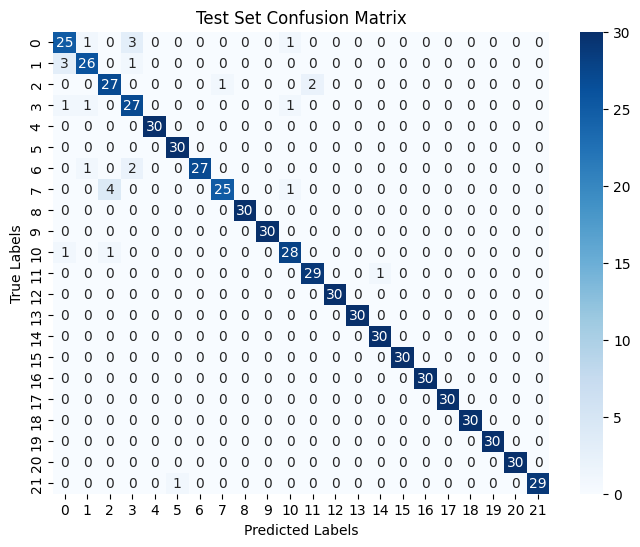

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Predict on the test data using your trained model
y_test_pred = best_model.predict(X_test)

# Compute the confusion matrix for the test set
test_cm = confusion_matrix(y_test, y_test_pred)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(test_cm, annot=True, fmt='g', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))

# Labels and title
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Test Set Confusion Matrix')

# Save the plot as an image
plt.savefig('confusion_matrix.png')  # Save the image to the specified path
plt.show()  # Show the plot


<ipython-input-22-4c45543604ca>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('Set1')(np.linspace(0, 1, n_classes))


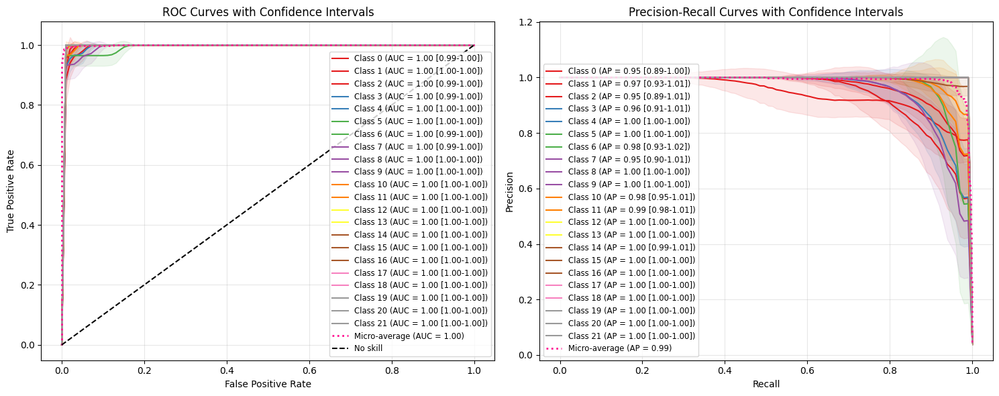

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize
from scipy import stats

def plot_curves_with_confidence(best_model, X_test, y_test, n_bootstrap=1000, n_classes=None):
    """
    Plot ROC and Precision-Recall curves with confidence intervals using bootstrapping.

    Parameters:
    -----------
    best_model : trained classifier with predict_proba method
    X_test : test features
    y_test : test labels
    n_bootstrap : number of bootstrap samples for confidence intervals
    n_classes : number of classes (if None, will be inferred from data)
    """
    if n_classes is None:
        n_classes = len(np.unique(y_test))

    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Binarize the labels
    y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

    # Get predictions
    y_pred_proba = best_model.predict_proba(X_test)

    # Colors for different classes
    colors = plt.cm.get_cmap('Set1')(np.linspace(0, 1, n_classes))

    # Plot ROC Curves
    plot_roc_curves(y_test_bin, y_pred_proba, n_classes, colors, ax1, n_bootstrap)

    # Plot Precision-Recall Curves
    plot_pr_curves(y_test_bin, y_pred_proba, n_classes, colors, ax2, n_bootstrap)

    plt.tight_layout()
    return fig

def plot_roc_curves(y_test_bin, y_pred_proba, n_classes, colors, ax, n_bootstrap):
    """Plot ROC curves with confidence intervals."""
    # Calculate micro-average ROC curve
    fpr_micro, tpr_micro, _ = roc_curve(y_test_bin.ravel(), y_pred_proba.ravel())
    roc_auc_micro = auc(fpr_micro, tpr_micro)

    # Plot individual ROC curves with confidence intervals
    for i in range(n_classes):
        # Bootstrap for confidence intervals
        tprs = []
        aucs = []
        mean_fpr = np.linspace(0, 1, 100)

        # Bootstrap sampling
        for _ in range(n_bootstrap):
            indices = np.random.randint(0, len(y_test_bin), len(y_test_bin))
            if len(y_test_bin[indices, i]) > 0:
                fpr, tpr, _ = roc_curve(y_test_bin[indices, i], y_pred_proba[indices, i])
                tprs.append(np.interp(mean_fpr, fpr, tpr))
                tprs[-1][0] = 0.0
                aucs.append(auc(fpr, tpr))

        # Calculate mean and std for TPR
        mean_tpr = np.mean(tprs, axis=0)
        std_tpr = np.std(tprs, axis=0)

        # Calculate AUC confidence interval
        auc_mean = np.mean(aucs)
        auc_std = np.std(aucs)
        auc_ci = stats.norm.interval(0.95, loc=auc_mean, scale=auc_std)

        # Plot ROC curve and confidence interval
        ax.plot(mean_fpr, mean_tpr, color=colors[i],
                label=f'Class {i} (AUC = {auc_mean:.2f} [{auc_ci[0]:.2f}-{auc_ci[1]:.2f}])')
        ax.fill_between(mean_fpr, mean_tpr - std_tpr, mean_tpr + std_tpr,
                       color=colors[i], alpha=0.1)

    # Plot micro-average ROC curve
    ax.plot(fpr_micro, tpr_micro, label=f'Micro-average (AUC = {roc_auc_micro:.2f})',
            color='deeppink', linestyle=':', linewidth=2)

    # Plot diagonal line
    ax.plot([0, 1], [0, 1], 'k--', label='No skill')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('ROC Curves with Confidence Intervals')
    ax.legend(loc='lower right', fontsize='small')
    ax.grid(True, alpha=0.3)

def plot_pr_curves(y_test_bin, y_pred_proba, n_classes, colors, ax, n_bootstrap):
    """Plot Precision-Recall curves with confidence intervals."""
    # Calculate micro-average precision-recall curve
    precision_micro, recall_micro, _ = precision_recall_curve(
        y_test_bin.ravel(), y_pred_proba.ravel())
    ap_micro = average_precision_score(y_test_bin.ravel(), y_pred_proba.ravel())

    # Plot individual PR curves with confidence intervals
    for i in range(n_classes):
        # Bootstrap for confidence intervals
        precisions = []
        average_precisions = []
        mean_recall = np.linspace(0, 1, 100)

        # Bootstrap sampling
        for _ in range(n_bootstrap):
            indices = np.random.randint(0, len(y_test_bin), len(y_test_bin))
            if len(y_test_bin[indices, i]) > 0:
                precision, recall, _ = precision_recall_curve(
                    y_test_bin[indices, i], y_pred_proba[indices, i])
                precisions.append(np.interp(mean_recall, recall[::-1], precision[::-1]))
                average_precisions.append(
                    average_precision_score(y_test_bin[indices, i], y_pred_proba[indices, i]))

        # Calculate mean and std for precision
        mean_precision = np.mean(precisions, axis=0)
        std_precision = np.std(precisions, axis=0)

        # Calculate AP confidence interval
        ap_mean = np.mean(average_precisions)
        ap_std = np.std(average_precisions)
        ap_ci = stats.norm.interval(0.95, loc=ap_mean, scale=ap_std)

        # Plot PR curve and confidence interval
        ax.plot(mean_recall, mean_precision, color=colors[i],
                label=f'Class {i} (AP = {ap_mean:.2f} [{ap_ci[0]:.2f}-{ap_ci[1]:.2f}])')
        ax.fill_between(mean_recall, mean_precision - std_precision,
                       mean_precision + std_precision, color=colors[i], alpha=0.1)

    # Plot micro-average PR curve
    ax.plot(recall_micro, precision_micro,
            label=f'Micro-average (AP = {ap_micro:.2f})',
            color='deeppink', linestyle=':', linewidth=2)

    ax.set_xlabel('Recall')
    ax.set_ylabel('Precision')
    ax.set_title('Precision-Recall Curves with Confidence Intervals')
    ax.legend(loc='lower left', fontsize='small')
    ax.grid(True, alpha=0.3)

# Example usage:
# Assuming you have your best_model, X_test, and y_test from your previous code
fig = plot_curves_with_confidence(best_model, X_test, y_test, n_bootstrap=1000)
plt.savefig('enhanced_model_evaluation.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Predict probabilities on the test set using your trained stacking model
y_test_pred_proba = best_model.predict_proba(X_test)

# For multi-class classification, binarize the labels
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# If it's binary classification, we can simply take the probabilities of the positive class (index 1)
# For multi-class, compute the ROC curve for each class
fpr = {}
tpr = {}
roc_auc = {}

for i in range(len(np.unique(y_test))):  # Loop for each class
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_test_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for all classes (or just the binary class if it's a binary classification)
plt.figure(figsize=(8, 7))

for i in range(len(np.unique(y_test))):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'Class {i} ROC curve (area = {roc_auc[i]:.2f})')

# Plot the diagonal line (no skill)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Stacked Classifier')
plt.legend(loc='lower right')

# Save the plot as an image
plt.savefig('roc_curve_stacked.png')  # Save the image to the specified path
plt.show()  # Show the plot

AttributeError: This 'StackingClassifier' has no attribute 'predict_proba'

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np

# Predict probabilities on the test set using the best stacking model
y_test_pred_proba = best_model.predict_proba(X_test)

# Binarize the test labels for multi-class ROC computation
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# Initialize dictionaries to store FPR, TPR, and AUC for each class
fpr = {}
tpr = {}
roc_auc = {}

# Compute ROC curve and AUC for each class
for i in range(len(np.unique(y_test))):  # Loop over each class
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_test_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for all classes
plt.figure(figsize=(10, 8))
for i in range(len(np.unique(y_test))):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'Class {i} ROC curve (area = {roc_auc[i]:.2f})')

# Plot the diagonal line (no-skill classifier)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

# Add labels, title, and legend
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Stacked Classifier')
plt.legend(loc='lower right')

# Save the plot as an image
plt.savefig('roc_curve_stacked.png')  # Save the plot
plt.show()  # Show the plot


AttributeError: This 'StackingClassifier' has no attribute 'predict_proba'

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

# Predict probabilities on the test set
y_test_pred_proba = best_model.predict_proba(X_test)

# Binarize the target variable for multi-class ROC curve
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# Calculate macro-averaged AUC score
macro_auc = roc_auc_score(y_test_bin, y_test_pred_proba, average='macro')

# Calculate weighted-averaged AUC score
weighted_auc = roc_auc_score(y_test_bin, y_test_pred_proba, average='weighted')

print(f"Macro-Averaged AUC Score: {macro_auc:.4f}")
print(f"Weighted-Averaged AUC Score: {weighted_auc:.4f}")

Macro-Averaged AUC Score: 0.9990
Weighted-Averaged AUC Score: 0.9990


**Meta Learner Ada**

Class Distribution: Counter({0: 502, 1: 498})
Missing Values in Dataset: 0

Individual Model Evaluation:
Random Forest Cross-Validation Accuracy: 0.8900
Gradient Boosting Cross-Validation Accuracy: 0.8775
CatBoost Cross-Validation Accuracy: 0.8863

Training the Stacking Model with GridSearchCV...
Fitting 5 folds for each of 4 candidates, totalling 20 fits

Best Parameters: {'final_estimator__learning_rate': 0.01, 'final_estimator__n_estimators': 50}
Best Cross-Validation Accuracy: 0.8900
Training Set Accuracy: 1.0000
Test Set Accuracy: 0.9050

Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.91      0.91      0.91       106
           1       0.89      0.90      0.90        94

    accuracy                           0.91       200
   macro avg       0.90      0.90      0.90       200
weighted avg       0.91      0.91      0.91       200



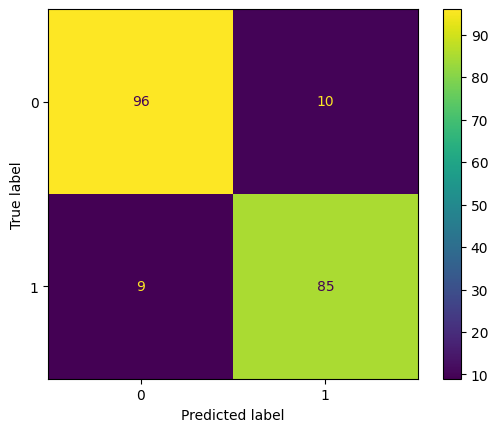

In [ ]:
import numpy as np
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.datasets import make_classification
from collections import Counter

# Set random seed
random_seed = 42

# Simulate a sample dataset for demonstration (replace with your actual dataset)
X, y = make_classification(
    n_samples=1000, n_features=20, n_informative=15, n_redundant=5,
    random_state=random_seed, n_classes=2
)

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_seed)

# Validate dataset
print(f"Class Distribution: {Counter(y)}")
print(f"Missing Values in Dataset: {np.isnan(X).sum()}")

# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Feature Selection
selector = SelectKBest(f_classif, k=15)  # Selecting top 15 features
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_test_scaled)

# Base Learners
rf_tuned = RandomForestClassifier(
    bootstrap=False, n_estimators=200, max_depth=15,
    min_samples_split=2, min_samples_leaf=1, random_state=random_seed
)

gboost_tuned = GradientBoostingClassifier(
    subsample=0.8, n_estimators=100, learning_rate=0.05,
    max_depth=4, min_samples_split=10, min_samples_leaf=5, random_state=random_seed
)

catboost_tuned = CatBoostClassifier(
    iterations=1000, depth=4, learning_rate=0.05, l2_leaf_reg=1, random_state=random_seed, verbose=0
)

# Individual Model Evaluation
models = {
    "Random Forest": rf_tuned,
    "Gradient Boosting": gboost_tuned,
    "CatBoost": catboost_tuned
}

print("\nIndividual Model Evaluation:")
for name, model in models.items():
    scores = cross_val_score(model, X_train_selected, y_train, cv=5, scoring='accuracy')
    print(f"{name} Cross-Validation Accuracy: {np.mean(scores):.4f}")

# Meta-Learner: AdaBoost
meta_learner = AdaBoostClassifier(random_state=random_seed)

# Simplified Stacking Classifier
stacking_clf_simple = StackingClassifier(
    estimators=[
        ('random_forest', rf_tuned),
        ('gradient_boosting', gboost_tuned),
        ('catboost', catboost_tuned)
    ],
    final_estimator=meta_learner
)

# Hyperparameter Grid for AdaBoost Meta-Learner
param_grid = {
    'final_estimator__n_estimators': [50, 100],
    'final_estimator__learning_rate': [0.01, 0.1]
}

# GridSearchCV
grid_search = GridSearchCV(
    estimator=stacking_clf_simple, param_grid=param_grid, cv=5,
    scoring='accuracy', n_jobs=-1, verbose=1
)

print("\nTraining the Stacking Model with GridSearchCV...")
grid_search.fit(X_train_selected, y_train)

# Best Model and Parameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"\nBest Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Evaluate Best Model
y_train_pred = best_model.predict(X_train_selected)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Set Accuracy: {train_accuracy:.4f}")

y_test_pred = best_model.predict(X_test_selected)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Set Accuracy: {test_accuracy:.4f}")

# Detailed Evaluation
print("\nClassification Report on Test Set:")
print(classification_report(y_test, y_test_pred))

ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)

**Meta Learner GB**

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import numpy as np

# Set random seed
random_seed = 42

# Initialize hyperparameter-tuned classifiers (only RF, SVC, and XGB)
rf_tuned = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=random_seed
)

# Decision Tree Classifier
dt_tuned = DecisionTreeClassifier(
    max_depth=5,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=random_seed
)

catboost_tuned = CatBoostClassifier(
    depth=4,
    iterations=1000,
    l2_leaf_reg=1,
    learning_rate=0.05,
    random_state=random_seed,
    verbose=0  # Turn off CatBoost's output during training
)

# Define the base learners (Random Forest, DT, CatBoost)
base_learners = [
    ('rf_tuned', rf_tuned),
    ('dt_tuned', dt_tuned),
    ('catboost_tuned', catboost_tuned)
]

# Define the meta-learner as Gradient Boosting
meta_learner = GradientBoostingClassifier()

# Create the stacking classifier
stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner)

# Simplified param_grid for GradientBoosting meta-learner
param_grid = {
    'final_estimator__n_estimators': [50, 100],  # Reduced n_estimators
    'final_estimator__learning_rate': [0.01, 0.1],  # Reduced learning rates
    'final_estimator__max_depth': [3, 4],  # Reduced max_depth
}

# Set up GridSearchCV for the stacking classifier with 2-fold cross-validation
grid_search = GridSearchCV(estimator=stacking_clf, param_grid=param_grid, cv=2, scoring='accuracy', n_jobs=-1)

# Train the model with grid search
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Evaluate the best model on the training set
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Set Accuracy: {train_accuracy:.4f}")

# Evaluate the best model on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Set Accuracy: {test_accuracy:.4f}")

Best Parameters: {'final_estimator__learning_rate': 0.01, 'final_estimator__max_depth': 3, 'final_estimator__n_estimators': 100}
Best Cross-Validation Accuracy: 0.8975
Training Set Accuracy: 1.0000
Test Set Accuracy: 0.9250


**Meta Learner CatBoost**

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score
import numpy as np

# Set random seed
random_seed = 42

# Example data (ensure you load your dataset before this step)
# data = pd.read_csv("your_data.csv")  # Make sure you load your actual dataset
# X = data.drop('target', axis=1)  # Assuming 'target' is the label column
# y = data['target']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_seed)

# Initialize hyperparameter-tuned classifiers (only RF, SVC, and XGB)
rf_tuned = RandomForestClassifier(
    n_estimators=50,  # Reduced n_estimators
    max_depth=5,      # Reduced max_depth for faster training
    random_state=random_seed
)

# Decision Tree Classifier
dt_tuned = DecisionTreeClassifier(
    max_depth=5,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=random_seed
)

gboost_tuned = GradientBoostingClassifier(
    subsample=0.8, n_estimators=50, learning_rate=0.05,  # Reduced n_estimators
    max_depth=4, min_samples_split=10, min_samples_leaf=5, random_state=random_seed
)

# Define the base learners (Random Forest, DT, Gradient Boosting)
base_learners = [
    ('rf_tuned', rf_tuned),
    ('dt_tuned', dt_tuned),
    ('gboost_tuned', gboost_tuned)
]

# Define the meta-learner as CatBoost
meta_learner = CatBoostClassifier(verbose=0)

# Create the stacking classifier
stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner)

# Simplified param_grid for GradientBoosting meta-learner
param_grid = {
    'final_estimator__n_estimators': [50],  # Reduced n_estimators
    'final_estimator__learning_rate': [0.01, 0.1],  # Reduced learning rates
    'final_estimator__max_depth': [3],  # Reduced max_depth
}

# Set up GridSearchCV for the stacking classifier with 2-fold cross-validation
grid_search = GridSearchCV(estimator=stacking_clf, param_grid=param_grid, cv=2, scoring='accuracy', n_jobs=-1)

# Train the model with grid search
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Evaluate the best model on the training set
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Set Accuracy: {train_accuracy:.4f}")

# Evaluate the best model on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Set Accuracy: {test_accuracy:.4f}")

Best Parameters: {'final_estimator__learning_rate': 0.1, 'final_estimator__max_depth': 3, 'final_estimator__n_estimators': 50}
Best Cross-Validation Accuracy: 0.9311
Training Set Accuracy: 0.9894
Test Set Accuracy: 0.9318


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


**CatBoost**

In [ ]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Load your dataset (replace with your dataset file)
data = df  # Ensure `df` is your DataFrame

# Define features (X) and target (y)
X = data.drop('Crop', axis=1)  # Replace 'Crop' with your target column name
y = data['Crop']

# Separate categorical and numerical columns
categorical_features = X.select_dtypes(include=['object']).columns.tolist()
numerical_features = X.select_dtypes(exclude=['object']).columns.tolist()

# Convert categorical features to string (if needed)
X[categorical_features] = X[categorical_features].astype(str)

# Apply Min-Max Scaling to numerical features
scaler = MinMaxScaler()
X[numerical_features] = scaler.fit_transform(X[numerical_features])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize CatBoostClassifier with optimized parameters
model = CatBoostClassifier(
    iterations=100,             # Reduced iterations for faster training
    learning_rate=0.1,          # Adjust step size for faster convergence
    depth=4,                    # Reduced tree depth for faster training
    loss_function='MultiClass', # Multi-class classification task
    verbose=100,                # Display progress every 100 iterations
    early_stopping_rounds=50    # Early stopping after 50 rounds without improvement
)

# Fit the model
model.fit(X_train, y_train, cat_features=categorical_features)

# Make predictions on both train and test sets
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculate accuracy for both train and test sets
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

# Print train and test accuracy results
print(f"Train Accuracy: {train_accuracy:.3f}")
print(f"Test Accuracy: {test_accuracy:.3f}")

# Print classification report for both train and test sets
print("\nClassification Report (Train Set):")
print(classification_report(y_train, y_train_pred))

print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))


0:	learn: 2.6522144	total: 15.8ms	remaining: 1.56s
99:	learn: 0.2233521	total: 2.02s	remaining: 0us
Train Accuracy: 0.958
Test Accuracy: 0.926

Classification Report (Train Set):
                  precision    recall  f1-score   support

       Aman Rice       0.84      0.81      0.82       116
       Aush Rice       0.92      0.95      0.93       105
            Bean       0.86      0.86      0.86       118
       Boro Rice       0.85      0.88      0.86       114
        Calabash       1.00      1.00      1.00       126
     Cauliflower       1.00      1.00      1.00       115
Colocasia leaves       0.97      0.94      0.96       123
            Corn       0.93      0.96      0.95       128
        Eggplant       0.99      0.94      0.97       125
            Jute       0.97      0.97      0.97       115
       Leafy Veg       0.97      0.96      0.96       123
        Oil crop       0.87      0.97      0.92       114
           Onion       0.98      1.00      0.99       118
        

**Hyperparameter Tuning CatBoost**

In [ ]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd
import numpy as np

# Load your dataset
data = df  # Ensure `df` is your DataFrame

# Define features (X) and target (y)
X = data.drop('Crop', axis=1)  # Replace 'Crop' with your target column name
y = data['Crop']

# Separate categorical and numerical columns
categorical_features = X.select_dtypes(include=['object']).columns.tolist()
numerical_features = X.select_dtypes(exclude=['object']).columns.tolist()

# Convert categorical features to string (if needed)
X[categorical_features] = X[categorical_features].astype(str)

# Apply Min-Max Scaling to numerical features
scaler = MinMaxScaler()
X[numerical_features] = scaler.fit_transform(X[numerical_features])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the CatBoostClassifier
model = CatBoostClassifier(cat_features=categorical_features, verbose=0, loss_function="MultiClass")

# Define the hyperparameter distribution (RandomizedSearchCV will sample from this)
param_distributions = {
    "iterations": [300, 500],
    "learning_rate": [0.01, 0.05, 0.1],
    "depth": [4, 6],
    "l2_leaf_reg": [1, 3, 5]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_distributions,
    n_iter=10,  # Number of random combinations to try
    scoring="accuracy",  # Adjust scoring metric if needed
    cv=2,  # 2-fold cross-validation (faster)
    verbose=1,  # Verbosity level
    n_jobs=-1,  # Use all available cores
    random_state=42
)

# Perform the random search
random_search.fit(X_train, y_train)

# Get the best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Cross-Validation Accuracy:", random_search.best_score_)

# Train the final model with the best parameters
best_model = random_search.best_estimator_
best_model.fit(X_train, y_train)

# Make predictions
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# Calculate accuracy
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Best Cross-Validation Accuracy: {random_search.best_score_:.4f}")

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_test_pred))


Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters: {'learning_rate': 0.1, 'l2_leaf_reg': 5, 'iterations': 500, 'depth': 4}
Best Cross-Validation Accuracy: 0.9412878787878788
Train Accuracy: 0.9917
Test Accuracy: 0.9485
Best Cross-Validation Accuracy: 0.9413
Classification Report:
                  precision    recall  f1-score   support

       Aman Rice       0.78      0.85      0.82        34
       Aush Rice       0.95      0.89      0.92        45
            Bean       0.96      0.84      0.90        32
       Boro Rice       0.81      0.81      0.81        36
        Calabash       1.00      1.00      1.00        24
     Cauliflower       1.00      1.00      1.00        35
Colocasia leaves       0.93      0.96      0.95        27
            Corn       0.81      1.00      0.90        22
        Eggplant       1.00      0.96      0.98        25
            Jute       1.00      0.97      0.99        35
       Leafy Veg       0.93      1.00      0.96      

In [ ]:
Results(CatBoostClassifier(
    depth=4,                    # Maximum depth of trees
    iterations=500,             # Number of boosting iterations
    l2_leaf_reg=5,              # L2 regularization term for leaf weights
    learning_rate=0.1,         # Learning rate for the model
    cat_features=categorical_features,  # Categorical features
    loss_function="MultiClass", # Multi-class classification
    random_state=42             # Seed for reproducibility
))


0:	learn: 2.7073354	total: 20.6ms	remaining: 10.3s
1:	learn: 2.4414781	total: 42.5ms	remaining: 10.6s
2:	learn: 2.3026703	total: 62.2ms	remaining: 10.3s
3:	learn: 2.1866527	total: 84.4ms	remaining: 10.5s
4:	learn: 2.0304333	total: 106ms	remaining: 10.4s
5:	learn: 1.8945808	total: 123ms	remaining: 10.1s
6:	learn: 1.7755979	total: 147ms	remaining: 10.3s
7:	learn: 1.6520579	total: 164ms	remaining: 10.1s
8:	learn: 1.5480193	total: 182ms	remaining: 9.95s
9:	learn: 1.4556139	total: 202ms	remaining: 9.91s
10:	learn: 1.3620621	total: 222ms	remaining: 9.88s
11:	learn: 1.3156913	total: 240ms	remaining: 9.77s
12:	learn: 1.2598055	total: 259ms	remaining: 9.68s
13:	learn: 1.2056131	total: 279ms	remaining: 9.68s
14:	learn: 1.1542769	total: 298ms	remaining: 9.63s
15:	learn: 1.0996568	total: 316ms	remaining: 9.57s
16:	learn: 1.0718880	total: 335ms	remaining: 9.5s
17:	learn: 1.0199284	total: 373ms	remaining: 9.99s
18:	learn: 0.9864935	total: 394ms	remaining: 9.97s
19:	learn: 0.9481567	total: 421ms	rema

**LIME-XAI**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
!pip install lime
import lime
import lime.lime_tabular
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from lime.lime_tabular import LimeTabularExplainer
from sklearn.inspection import PartialDependenceDisplay

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=f66e5ffeb907a667a97132d23a4aea158ae6f856c361f31b3f95168b6497bf22
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
import torch
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)

In [ ]:
# Identify columns with numeric data types
numeric_cols = df.select_dtypes(include=np.number).columns

# Calculate the mean for only numeric columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())

In [ ]:
# Declare feature vector and target variable
X = df[['N','P','K','pH','Temp(°C)','Humidity(%)', 'Moisture(%)', 'Rainfall(cm)']]
y = df['Crop']

In [ ]:
# Split the data into train and test data:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [ ]:
!pip install shap

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.metrics import classification_report, accuracy_score
import lime.lime_tabular
import shap
import matplotlib.pyplot as plt
import warnings

# Ignore warnings
warnings.filterwarnings('ignore')

# Load and preprocess the dataset
df = pd.read_excel("New Final DataSet Without Sulphur.xlsx", engine='openpyxl')

# Handle missing values
numeric_cols = df.select_dtypes(include=np.number).columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())

# Features and target
X = df[['N', 'P', 'K', 'pH', 'Temp(\u00b0C)', 'Humidity(%)', 'Rainfall(cm)']]
y = df['Crop']

# Encode the target variable
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Scale features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Initialize models
rf_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
lr_model = LogisticRegression(max_iter=1000, random_state=42)

# Train models
rf_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)
lr_model.fit(X_train, y_train)

# Evaluate models and select the best one based on accuracy
models = {'RandomForest': rf_model, 'GradientBoosting': gb_model, 'LogisticRegression': lr_model}
best_model = None
best_accuracy = 0
best_model_name = ""

for model_name, model in models.items():
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Accuracy for {model_name}: {accuracy:.4f}")
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model = model
        best_model_name = model_name

print(f"\nBest model: {best_model_name} with accuracy: {best_accuracy:.4f}")

# Use LIME for the best model
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train,
    feature_names=['N', 'P', 'K', 'pH', 'Temp(\u00b0C)', 'Humidity(%)', 'Rainfall(cm)'],
    class_names=le.classes_,
    mode='classification'
)

# Generate LIME Explanation for Instance 5 using the best model
exp = explainer.explain_instance(X_test[5], best_model.predict_proba, num_features=6)
fig = exp.as_pyplot_figure()
plt.title(f"LIME Explanation for Instance 5 ({best_model_name})")
plt.savefig(f"lime_explanation_instance_5_{best_model_name}.png", dpi=300, bbox_inches='tight')
plt.close()
print(f"LIME explanation saved as lime_explanation_instance_5_{best_model_name}.png")

# SHAP Explanations for the best model
if isinstance(best_model, GradientBoostingClassifier) and len(le.classes_) > 2:
    # KernelExplainer for multi-class GradientBoostingClassifier
    subset = shap.sample(X_train, 100)  # Use a smaller subset for efficiency
    shap_explainer = shap.KernelExplainer(best_model.predict_proba, subset)

    # Calculate SHAP values for all instances in X_test
    shap_values = shap_explainer.shap_values(X_test)  # Instead of X_test[:10]

    # Ensure shap_values is handled as a list of arrays (one for each class)
    print("Using SHAP values for multi-class classification...")
    for i, class_name in enumerate(le.classes_):
        print(f"SHAP summary for class: {class_name}")

        # Convert `shap_values[i]` to a shape compatible with `X_test[:10]`
        shap_values_class = np.array(shap_values[i])
        if shap_values_class.shape[1] == X_test[:10].shape[1]:
            shap.summary_plot(
                shap_values_class, X_test[:10],
                feature_names=['N', 'P', 'K', 'pH', 'Temp(\u00b0C)', 'Humidity(%)', 'Rainfall(cm)']
            )
        else:
            print(f"Skipping class {class_name}: SHAP values shape mismatch.")
else:
    # TreeExplainer for binary classification or tree-based models
    shap_explainer = shap.TreeExplainer(best_model)
    shap_values = shap_explainer.shap_values(X_test)

    if isinstance(shap_values, list):
        # Handle binary classification case with TreeExplainer
        print("Using SHAP values for binary classification (list format)...")
        shap.summary_plot(
            shap_values[1], X_test,  # Class 1 SHAP values for binary classification
            feature_names=['N', 'P', 'K', 'pH', 'Temp(\u00b0C)', 'Humidity(%)', 'Rainfall(cm)']
        )
    else:
        # Handle binary classification case with single array
        print("Using SHAP values for binary classification (array format)...")
        shap.summary_plot(
            shap_values, X_test,
            feature_names=['N', 'P', 'K', 'pH', 'Temp(\u00b0C)', 'Humidity(%)', 'Rainfall(cm)']
        )


# Save the SHAP plot
plt.title(f"SHAP Summary Plot ({best_model_name})")
plt.savefig(f"shap_summary_plot_{best_model_name}.png", dpi=300, bbox_inches='tight')
plt.close()
print(f"SHAP summary plot for {best_model_name} saved as shap_summary_plot_{best_model_name}.png")

Accuracy for RandomForest: 0.9045
Accuracy for GradientBoosting: 0.9227
Accuracy for LogisticRegression: 0.7227

Best model: GradientBoosting with accuracy: 0.9227
LIME explanation saved as lime_explanation_instance_5_GradientBoosting.png


  0%|          | 0/660 [00:00<?, ?it/s]

Using SHAP values for multi-class classification...
SHAP summary for class: Aman Rice
Skipping class Aman Rice: SHAP values shape mismatch.
SHAP summary for class: Aush Rice
Skipping class Aush Rice: SHAP values shape mismatch.
SHAP summary for class: Bean
Skipping class Bean: SHAP values shape mismatch.
SHAP summary for class: Boro Rice
Skipping class Boro Rice: SHAP values shape mismatch.
SHAP summary for class: Calabash
Skipping class Calabash: SHAP values shape mismatch.
SHAP summary for class: Cauliflower
Skipping class Cauliflower: SHAP values shape mismatch.
SHAP summary for class: Colocasia leaves
Skipping class Colocasia leaves: SHAP values shape mismatch.
SHAP summary for class: Corn
Skipping class Corn: SHAP values shape mismatch.
SHAP summary for class: Eggplant
Skipping class Eggplant: SHAP values shape mismatch.
SHAP summary for class: Jute
Skipping class Jute: SHAP values shape mismatch.
SHAP summary for class: Leafy Veg
Skipping class Leafy Veg: SHAP values shape mismat

Fitting 3 folds for each of 2 candidates, totalling 6 fits
Train Accuracy (GradientBoosting): 1.0000
Test Accuracy (GradientBoosting): 0.9076
Best Cross-Validation Accuracy: 0.8858
Train Accuracy (Voting): 1.0000
Test Accuracy (Voting): 0.9121
LIME explanation saved as lime_explanation_instance_0_voting.png


  0%|          | 0/10 [00:00<?, ?it/s]

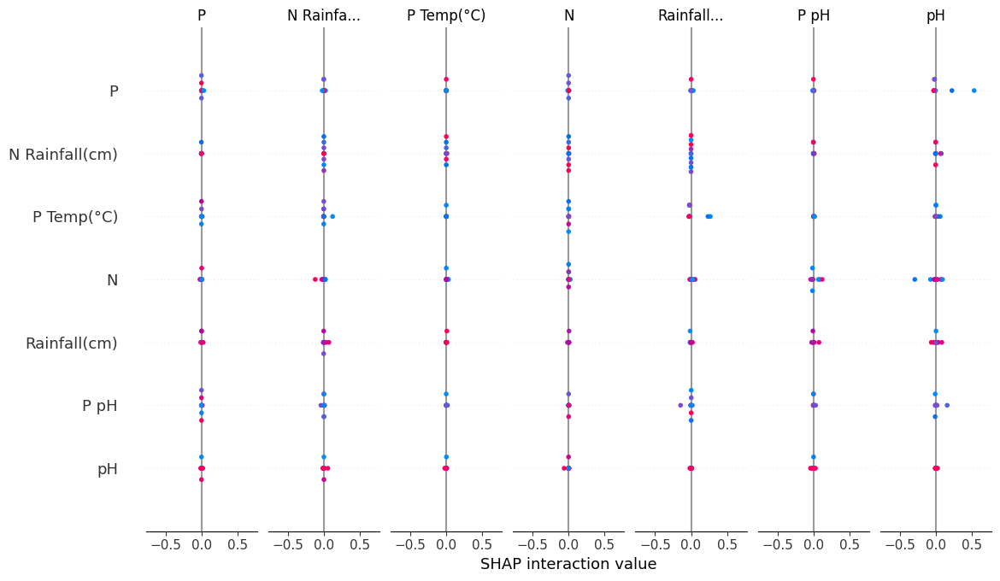

SHAP summary plot for Gradient Boosting (KernelExplainer) saved as shap_summary_plot_gradient_boosting_kernel.png


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, PolynomialFeatures
from sklearn.metrics import classification_report
import lime.lime_tabular
import shap
import matplotlib.pyplot as plt
import warnings

# Ignore warnings
warnings.filterwarnings('ignore')

# Load and preprocess the dataset
df = pd.read_excel("New Final DataSet Without Sulphur.xlsx", engine='openpyxl')

# Handle missing values using SimpleImputer (more flexible)
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
df[df.select_dtypes(include=np.number).columns] = imputer.fit_transform(df.select_dtypes(include=np.number))

# Feature Engineering: Add Polynomial Features for interaction terms
X = df[['N', 'P', 'K', 'pH', 'Temp(\u00b0C)', 'Humidity(%)', 'Rainfall(cm)']]
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X)

# Target Variable
y = df['Crop']
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Scale features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_poly)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Hyperparameter Tuning with Reduced GridSearchCV Scope
param_grid = {
    'n_estimators': [100],  # Single value for faster tuning
    'learning_rate': [0.1],  # Single value
    'max_depth': [3, 5]  # Fewer options
}
gb_model = GradientBoostingClassifier(random_state=42)
grid_search = GridSearchCV(gb_model, param_grid, cv=3, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Best model
best_gb_model = grid_search.best_estimator_
train_accuracy_gb = best_gb_model.score(X_train, y_train)
test_accuracy_gb = best_gb_model.score(X_test, y_test)

# Quick Cross-Validation
cross_val_scores = cross_val_score(best_gb_model, X_scaled, y_encoded, cv=3, scoring='accuracy')  # 3 folds
best_cv_accuracy = np.mean(cross_val_scores)

# Print Results
print(f"Train Accuracy (GradientBoosting): {train_accuracy_gb:.4f}")
print(f"Test Accuracy (GradientBoosting): {test_accuracy_gb:.4f}")
print(f"Best Cross-Validation Accuracy: {best_cv_accuracy:.4f}")

# Simplified Voting Classifier with Soft Voting
rf_model = RandomForestClassifier(n_estimators=50, max_depth=5, random_state=42)
lr_model = LogisticRegression(max_iter=500, random_state=42)
voting_model = VotingClassifier(estimators=[('gb', best_gb_model), ('rf', rf_model)], voting='soft')  # Soft voting
voting_model.fit(X_train, y_train)

# Evaluate Voting Classifier
train_accuracy_voting = voting_model.score(X_train, y_train)
test_accuracy_voting = voting_model.score(X_test, y_test)
print(f"Train Accuracy (Voting): {train_accuracy_voting:.4f}")
print(f"Test Accuracy (Voting): {test_accuracy_voting:.4f}")

# Model Interpretability: LIME for one instance only
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train,
    feature_names=poly.get_feature_names_out(X.columns),
    class_names=le.classes_,
    mode='classification'
)
exp = explainer.explain_instance(X_test[0], voting_model.predict_proba, num_features=6)
fig = exp.as_pyplot_figure()
plt.title("LIME Explanation for Instance 0 (Voting Classifier)")
plt.savefig("lime_explanation_instance_0_voting.png", dpi=300, bbox_inches='tight')
plt.close()
print("LIME explanation saved as lime_explanation_instance_0_voting.png")

# SHAP explanation using KernelExplainer for GradientBoostingClassifier
import shap

# Define a simpler dataset subset for SHAP explanations to improve computation speed
X_sample = X_train[:100]  # Take a subset of the training data
shap_explainer_gb = shap.KernelExplainer(best_gb_model.predict_proba, X_sample)

# Generate SHAP values for a subset of test data
shap_values_gb = shap_explainer_gb.shap_values(X_test[:10])  # Test on 10 samples

# Summary plot for SHAP values
shap.summary_plot(shap_values_gb, X_test[:10], feature_names=poly.get_feature_names_out(X.columns))
plt.savefig("shap_summary_plot_gradient_boosting_kernel.png", dpi=300, bbox_inches='tight')
plt.close()
print("SHAP summary plot for Gradient Boosting (KernelExplainer) saved as shap_summary_plot_gradient_boosting_kernel.png")
